In [1]:
import gpmultipy, scipy, dataset
import numpy as np
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline

In [3]:
ds = dataset.DataSet('data/ura3-pq-replicate/')
x,y,effect,labels = ds.build(Strain='ura3',mM_PQ=0.0,scale='range',Bio='E')
y = (y-y.mean())/y.std()

dm = np.ones((y.shape[1],1))

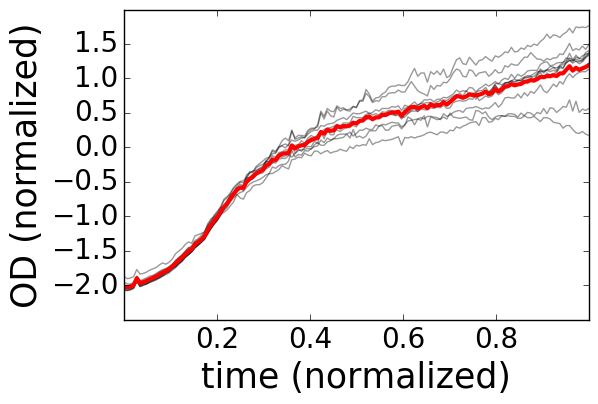

In [4]:
plt.plot(x,y,c='k',alpha=.4); plt.plot(x,y.mean(1),c='r',lw=3);
plt.xlabel("time (normalized)",fontsize=25)
plt.ylabel("OD (normalized)",fontsize=25)
plt.xticks(np.arange(.2,1,.2),fontsize=20)
plt.yticks(np.arange(-2,2,.5),fontsize=20)

plt.savefig("figures/ura3-pq-replicate/data-singleReplicate.pdf",bbox_inches='tight',dpi=300)

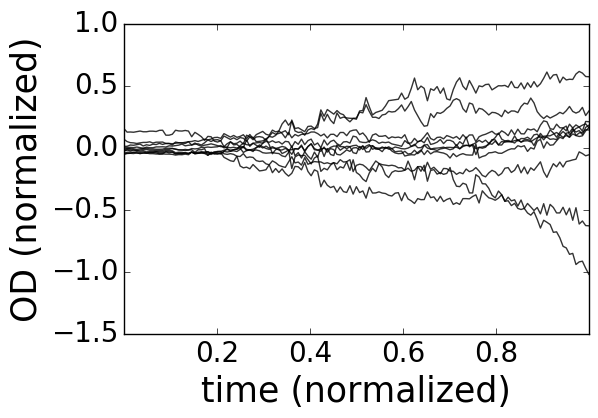

In [5]:
plt.figure(figsize=(6,4))

plt.plot(x,y-y.mean(1)[:,None],c='k',alpha=.8)

plt.xlabel("time (normalized)",fontsize=25)
plt.ylabel("OD (normalized)",fontsize=25)
plt.xticks(np.arange(.2,1,.2),fontsize=20)
plt.yticks(np.arange(-1.5,1.5,.5),fontsize=20)

plt.savefig("figures/ura3-pq-replicate/residuals-singleReplicate.pdf",bbox_inches='tight')

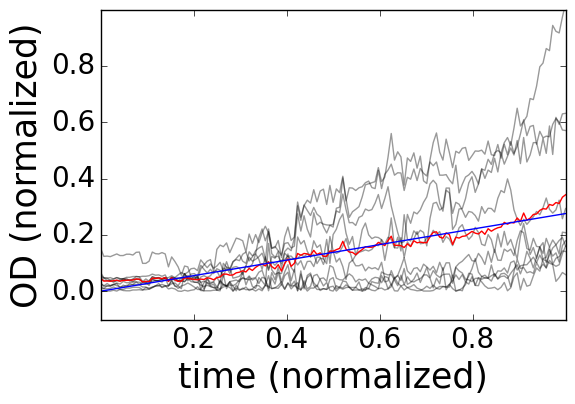

In [6]:
plt.figure(figsize=(6,4))

resid = y-y.mean(1)[:,None]
plt.plot(x,abs(resid),c='k',alpha=.4);
plt.plot(x,abs(resid).mean(1),c='r',alpha=1);

A = np.ones((x.shape[0],2))
A[:,1] = x[:,0]
beta,_,_,_ = np.linalg.lstsq(A,abs(resid).mean(1))
plt.plot(x,np.dot(A,beta))

plt.ylim(-.1,1)

plt.xlabel("time (normalized)",fontsize=25)
plt.ylabel("OD (normalized)",fontsize=25)
plt.xticks(np.arange(.2,1,.2),fontsize=20)
plt.yticks(np.arange(0,1,.2),fontsize=20)

plt.savefig("figures/ura3-pq-replicate/residual-mean-singleReplicate.pdf",bbox_inches='tight')

In [7]:
beta

array([ 0.00041061,  0.27554936])

# No replicate 

In [8]:
from gpmultipy.model import Model
from gpmultipy.prior import Prior
from gpmultipy.kernel import RBF, White
from gpmultipy.freeze import Freezer
from gpmultipy.sampler.slice import Slice

In [89]:
yKernel = White(1,.1)
k1 = RBF(1,.01,1)

p = y.shape[1]
dm = np.ones((1,p))

prior = Prior(x,k1,range(dm.shape[0]))

model = Model(x,y,dm)

In [90]:
prior.kernel.sigma

0.01

In [91]:
k1.K_inv(x)

array([[  9.25247301e+03,  -7.18759686e+02,  -6.90525998e+02, ...,
         -5.45797995e+00,  -1.11678527e+00,   3.49927749e+00],
       [ -7.18759686e+02,   9.30830708e+03,  -6.65117145e+02, ...,
         -8.85193857e+00,  -5.11006839e+00,  -1.11678527e+00],
       [ -6.90525998e+02,  -6.65117145e+02,   9.35984194e+03, ...,
         -1.20173448e+01,  -8.85193857e+00,  -5.45797995e+00],
       ..., 
       [ -5.45797995e+00,  -8.85193857e+00,  -1.20173448e+01, ...,
          9.35984194e+03,  -6.65117145e+02,  -6.90525998e+02],
       [ -1.11678527e+00,  -5.11006839e+00,  -8.85193857e+00, ...,
         -6.65117145e+02,   9.30830708e+03,  -7.18759686e+02],
       [  3.49927749e+00,  -1.11678527e+00,  -5.45797995e+00, ...,
         -6.90525998e+02,  -7.18759686e+02,   9.25247301e+03]])

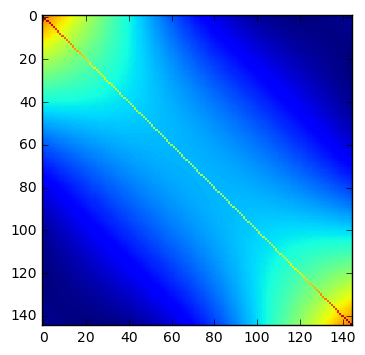

In [92]:
mu,cov = prior.functionParameters(model,yKernel)

plt.imshow(cov,interpolation='none')

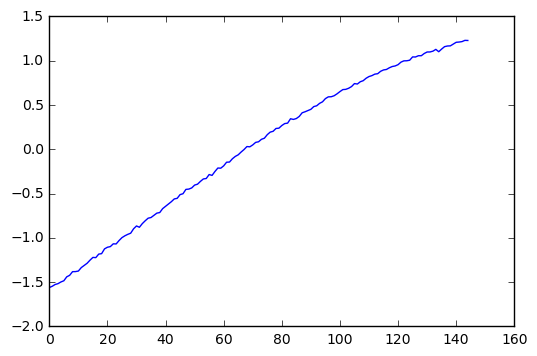

In [93]:
plt.plot(scipy.stats.multivariate_normal.rvs(mu,cov))

In [94]:
model.residual(0).shape

(145, 10)

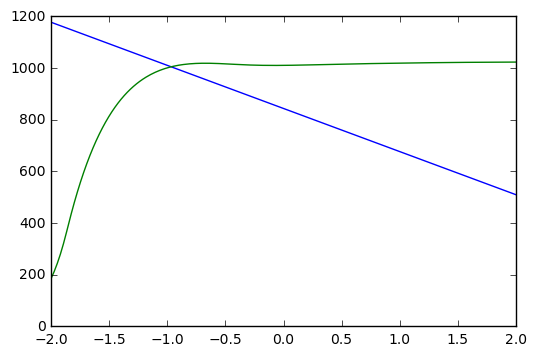

In [27]:
z = np.power(10,np.linspace(-1.5,4,300))
z = np.power(10,np.linspace(-2,2,300))

# plt.plot(np.log10(z),[kSigmaSlice.loglikelihood(np.log10(a)) for a in z])
# plt.plot(np.log(z),[kSigmaSlice.logdensity_fxn(a) for a in z])
plt.plot(np.log10(z),[prior.loglikelihood(model.beta,sigma=a) for a in z])
plt.plot(np.log10(z),[prior.loglikelihood(model.beta,lengthscale=a) for a in z])
# plt.plot(np.log(z),[kSigmaSlice.prior_logdensity_fxn(a) for a in z])

/home/ptonner/dev/combinatorial-growth/local/lib/python2.7/site-packages/gpmultipy/mvn.py:16: RuntimeWarning: divide by zero encountered in log
  det = np.log(np.linalg.det(L))


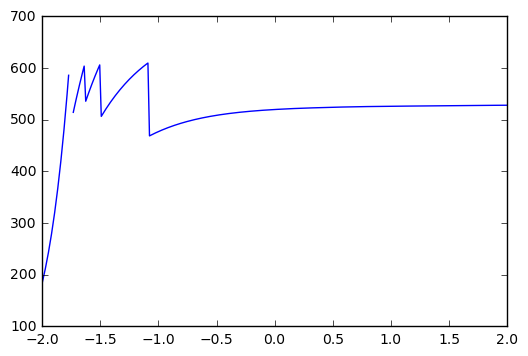

In [30]:
ll =[]
for a in z:
    cov = k1.K(x,lengthscale=a)
    ll.append(gpmultipy.mvn.logpdf(model.beta[:,0],prior.mu,cov))
    
plt.plot(np.log10(z),ll);

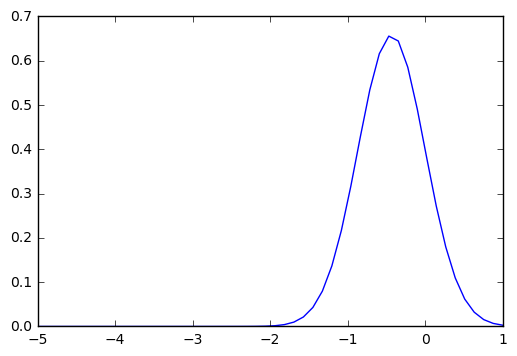

In [35]:
rv = scipy.stats.lognorm(1,scale=1e-0)
z = np.power(10,np.linspace(-5,1))
plt.plot(np.log10(z),rv.pdf(z))

# def debug_lognorm(x):
#     print x
#     return rv.logpdf(x)

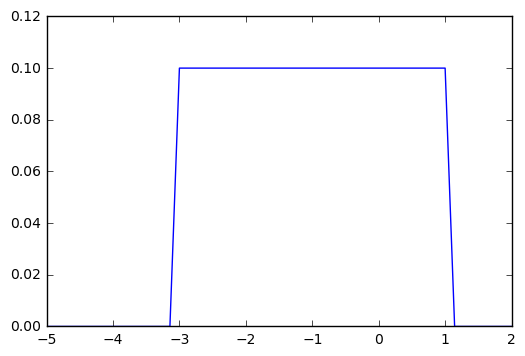

In [12]:
rv = scipy.stats.uniform(1e-3,1e1)
z = np.power(10,np.linspace(-5,2))
plt.plot(np.log10(z),rv.pdf(z))

def debug_unif(x):
    print x
    return rv.logpdf(x)

In [45]:
ySigmaSlice = Slice('ySigma',
                    lambda x: model.dataLikelihood(yKernel,sigma=x),
                    #lambda x: scipy.stats.uniform(1e-6,1e0).logpdf(x),
                    #lambda x: scipy.stats.lognorm(1,loc=1e-2,scale=1e-1).logpdf(x),
                    lambda x: scipy.stats.lognorm(1,scale=1e-0).logpdf(x),
                    #debug_lognorm,
                    .2,5,logspace=True)

kSigmaSlice = Slice('kSigma',
                    lambda x: prior.loglikelihood(model.beta,sigma=x),
                    lambda x: scipy.stats.uniform(1e-2,1e2).logpdf(x),
                    #debug_unif,
                    .2,5,logspace=True)

kLengthscaleSlice = Slice('kLengthscale',
                    lambda x: prior.loglikelihood(model.beta,lengthscale=x),
                    lambda x: scipy.stats.uniform(1e-2,1e2).logpdf(x),
                    .2,5,logspace=True)

samples = []
freeze = Freezer(yKernel=yKernel,k1=k1,model=model)

In [46]:
thin = 10
burnin = 0
nsample = 100

for i in range(nsample):
    prior.sample(model,yKernel)

    k1.sigma = kSigmaSlice.sample(k1.sigma)
    yKernel.sigma = ySigmaSlice.sample(yKernel.sigma)
    k1.lengthscale = kLengthscaleSlice.sample(k1.lengthscale)

    if i % thin == 0 and i > burnin:
        print model.dataLikelihood(yKernel),yKernel.sigma, k1.sigma, k1.lengthscale
        samples.append(freeze.freeze())

55.0661666826 0.0520358009642 0.570265144202 0.997275233062
179.362657642 0.0441261081813 75.5969139488 0.471011411482
186.528938835 0.0461828060749 95.9504963941 0.488862064971
184.649003441 0.0444834003937 84.938797415 0.400179796291
186.470842642 0.0456914520801 93.9876456145 0.443177108702
184.281272588 0.0439177973616 96.5659363019 0.387728822316
188.438000273 0.0448784935277 91.0337920198 0.466357873792
183.305451917 0.0445128297195 92.318509545 0.419919908092
183.875622142 0.0452372381554 94.9546371222 0.450753679641


(array([ 3.,  3.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([-0.41147191, -0.37044322, -0.32941452, -0.28838583, -0.24735713,
        -0.20632844, -0.16529975, -0.12427105, -0.08324236, -0.04221366,
        -0.00118497]),
 <a list of 10 Patch objects>)

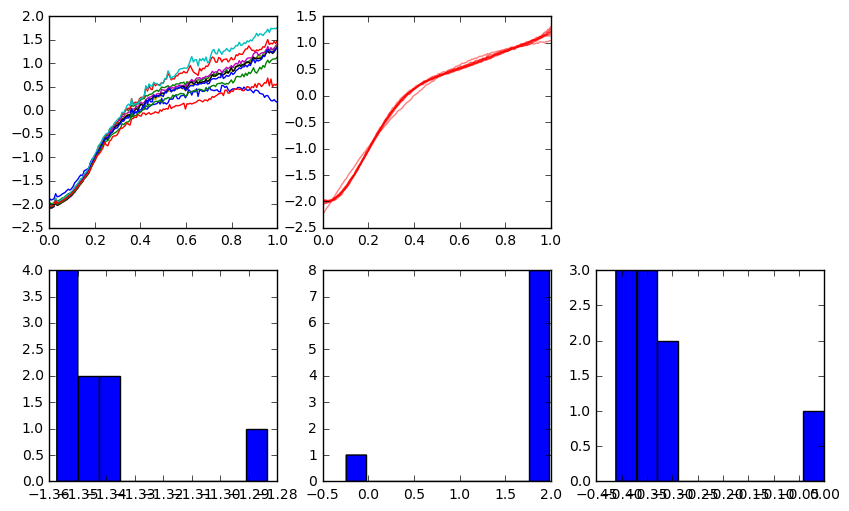

In [54]:
plt.figure(figsize=(10,6))
plt.subplot(231)
plt.plot(x,y)

plt.subplot(232)
plt.plot(x,np.array([s['model']['beta'][:,0] for s in samples]).T,c='r',alpha=.5)

plt.subplot(234)
plt.hist(np.log10([s['yKernel']['sigma'] for s in samples]))

plt.subplot(235)
plt.hist(np.log10([s['k1']['sigma'] for s in samples]))

plt.subplot(236)
plt.hist(np.log10([s['k1']['lengthscale'] for s in samples]))

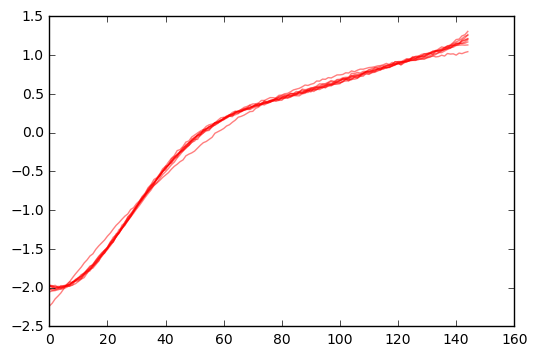

In [48]:
plt.plot(np.array([s['model']['beta'][:,0] for s in samples]).T,c='r',alpha=.5)

In [50]:
z = np.power(10,np.linspace(-2,2,300))

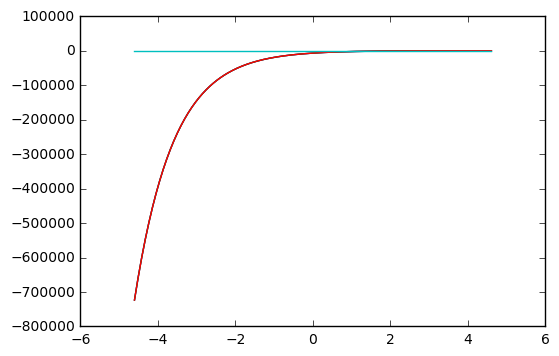

In [52]:
plt.plot(np.log(z),[kSigmaSlice.loglikelihood(np.log10(a)) for a in z])
plt.plot(np.log(z),[kSigmaSlice.logdensity_fxn(a) for a in z])
plt.plot(np.log(z),[prior.loglikelihood(model.beta,sigma=a) for a in z])
plt.plot(np.log(z),[kSigmaSlice.prior_logdensity_fxn(a) for a in z])

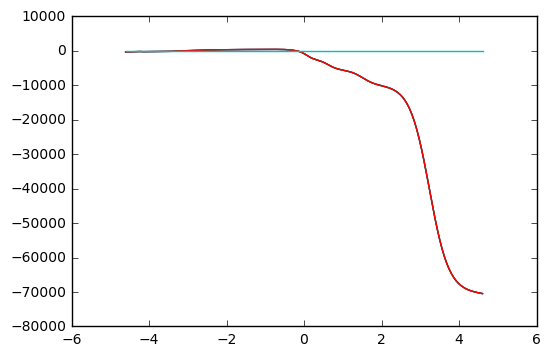

In [53]:
plt.plot(np.log(z),[kLengthscaleSlice.loglikelihood(np.log10(a)) for a in z])
plt.plot(np.log(z),[kLengthscaleSlice.logdensity_fxn(a) for a in z])
plt.plot(np.log(z),[prior.loglikelihood(model.beta,lengthscale=a) for a in z])
plt.plot(np.log(z),[kLengthscaleSlice.prior_logdensity_fxn(a) for a in z])

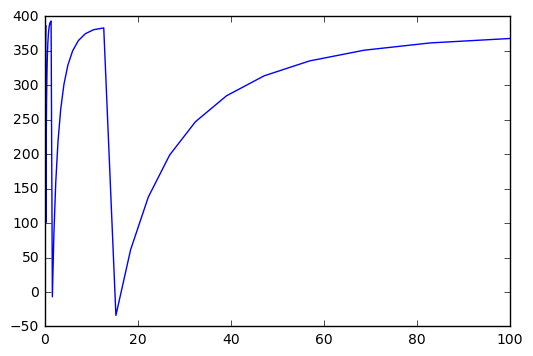

In [24]:
plt.plot(z,[prior.loglikelihood(model.beta,sigma=a) for a in z])

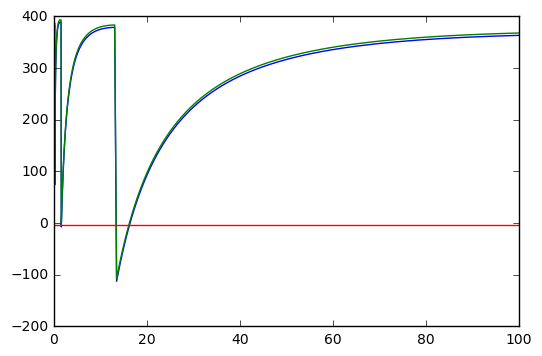

In [38]:
plt.plot(z,[kSigmaSlice.loglikelihood(np.log10(a)) for a in z])
plt.plot(z,[kSigmaSlice.logdensity_fxn(a) for a in z])
plt.plot(z,[kSigmaSlice.prior_logdensity_fxn(a) for a in z])

In [39]:
scipy.stats.multivariate_normal.logpdf()

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.])

In [18]:
k1.sigma,k1.lengthscale, yKernel.sigma

(0.61375384869636707, 0.18353163246435447, 0.046075781701113733)

In [19]:
kSigmaSlice.loglikelihood(np.log10(k1.sigma))

444.60996703829574

In [23]:
kLengthscaleSlice.loglikelihood(np.log10(k1.lengthscale)), kLengthscaleSlice.logdensity_fxn(k1.lengthscale), kLengthscaleSlice.prior_logdensity_fxn(k1.lengthscale)

(444.60996703829574, 449.21513722428381, -4.6051701859880918)

In [36]:
prior.kernel == k1

True

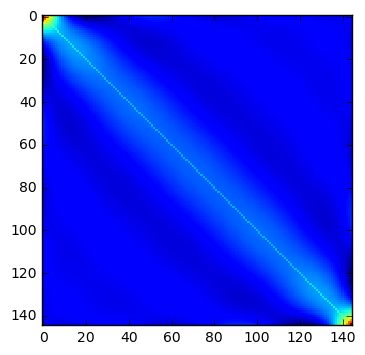

In [55]:
mu,cov = prior.functionParameters(model,yKernel)

plt.imshow(cov,interpolation='none')

# plt.plot(scipy.stats.multivariate_normal.rvs(mu,cov))

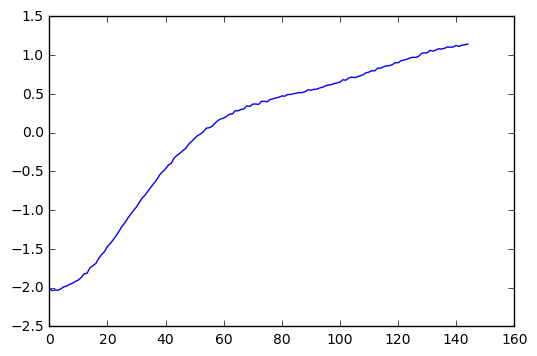

In [56]:
plt.plot(scipy.stats.multivariate_normal.rvs(mu,cov))

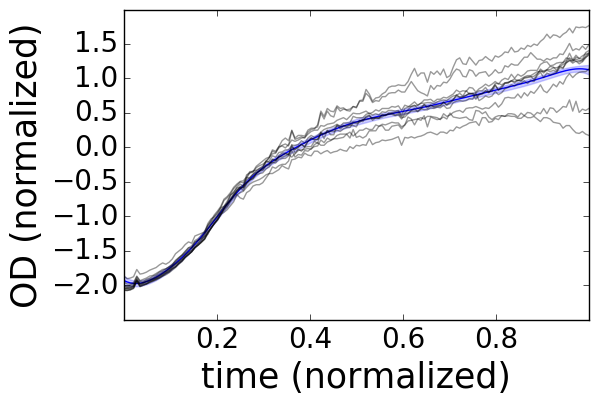

In [34]:
plt.figure(figsize=(6,4))

gpfanova.plot.plotFunctionSamples(m_noReplicate.functionSamples(0).values,x=x[:,0])
plt.plot(x[:,0],y,c='k',alpha=.4)

plt.xlabel("time (normalized)",fontsize=25)
plt.ylabel("OD (normalized)",fontsize=25)
plt.xticks(np.arange(.2,1,.2),fontsize=20)
plt.yticks(np.arange(-2,2,.5),fontsize=20)

plt.savefig("figures/ura3-pq-replicate/model-noReplicate-singleReplicate.pdf",bbox_inches='tight',dpi=300)

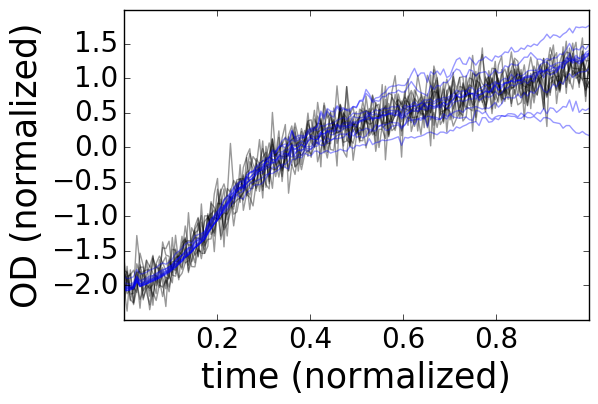

In [40]:
plt.figure(figsize=(6,4))

cov = m_noReplicate.y_k.K(m_noReplicate.x)
ysample = np.dot(m_noReplicate.design_matrix,m_noReplicate.functionSamples(0).values[-1,:][None,:]) +\
            scipy.stats.multivariate_normal.rvs(np.zeros(m_noReplicate.n),cov,size=m_noReplicate.m)

fsample = m_noReplicate.functionMatrix()

plt.plot(x[:,0],ysample.T,c='k',alpha=.4); 
plt.plot(x[:,0],y,c='b',alpha=.4); 
# plt.plot(x[:,0],fsample,c='r',lw=3);

plt.xlabel("time (normalized)",fontsize=25)
plt.ylabel("OD (normalized)",fontsize=25)
plt.xticks(np.arange(.2,1,.2),fontsize=20)
plt.yticks(np.arange(-2,2,.5),fontsize=20)

plt.savefig("figures/ura3-pq-replicate/model-noReplicate-generative-singleReplicate.pdf",bbox_inches='tight',dpi=300)

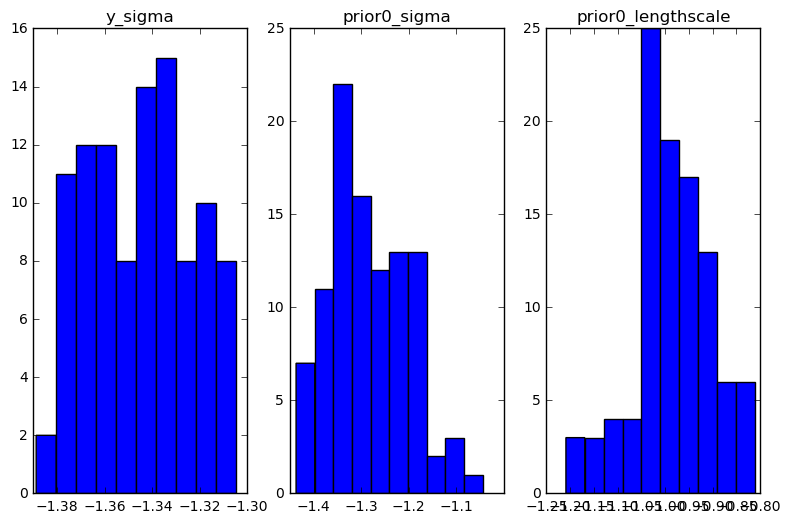

In [13]:
plt.figure(figsize=(16,6))
for i,p in enumerate(['y_sigma','prior0_sigma','prior0_lengthscale']):            
    plt.subplot(1,5,i+1); plt.title(p)
    plt.hist(m_noReplicate.parameter_history[p])

# With replicate 

In [74]:
# m_withReplicate = gpfanova.base.Base_withReplicate(x,y,designMatrix=dm,priorGroups=[[0]],
#                                      replicateSigmaBounds=(-1.5,-.5),
#                                      replicateLengthscaleBounds=(0,1),
#                                      bounds={'y_sigma':(-2,-1.3),'prior0_sigma':(-2,-1.1)})

# m_withReplicate = gpfanova.base.Base_withReplicate(x,y,designMatrix=dm,priorGroups=[[0]],
#                                      replicateSigmaBounds=(-1,1),
#                                      replicateLengthscaleBounds=(-1,1),
#                                      bounds={'y_sigma':(-2,-1.3),'prior0_sigma':(-1.5,0)})

m_withReplicate = gpfanova.base.Base_withReplicate(x,y,designMatrix=dm,priorGroups=[[0]],
                                     replicateSigmaBounds=(-4,-1.5),
                                     replicateLengthscaleBounds=(-1,1),
                                     bounds={'y_sigma':(-4,2),'prior0_sigma':(-2,2)})

# m_withReplicate.parameter_cache.y_sigma = -1.5
# m_withReplicate.parameter_cache.prior0_sigma = -1.5

In [75]:
m_withReplicate.sample(1000,thin=10,random=True)

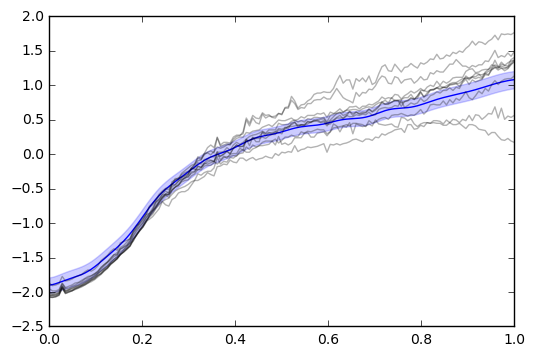

In [119]:
gpfanova.plot.plotFunctionSamples(m_withReplicate.functionSamples(0).values,x=x[:,0])
plt.plot(x[:,0],y,c='k',alpha=.3);
plt.savefig("figures/ura3-pq-replicate/model-withReplicate.pdf",bbox_inches='tight')

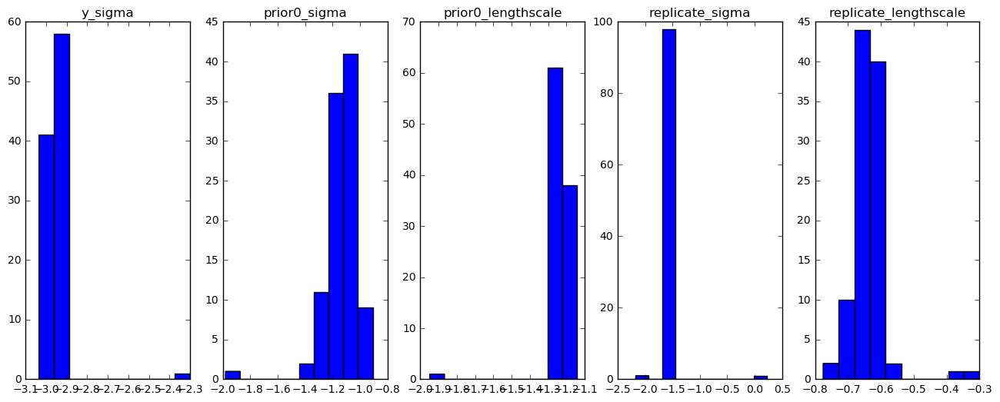

In [168]:
plt.figure(figsize=(16,6))
for i,p in enumerate(['y_sigma','prior0_sigma','prior0_lengthscale','replicate_sigma','replicate_lengthscale']):            
    plt.subplot(1,5,i+1); plt.title(p)
    plt.hist(m_withReplicate.parameter_history[p])
    
plt.savefig("figures/ura3-pq-replicate/model-withReplicate-hyperparams.pdf",bbox_inches='tight')

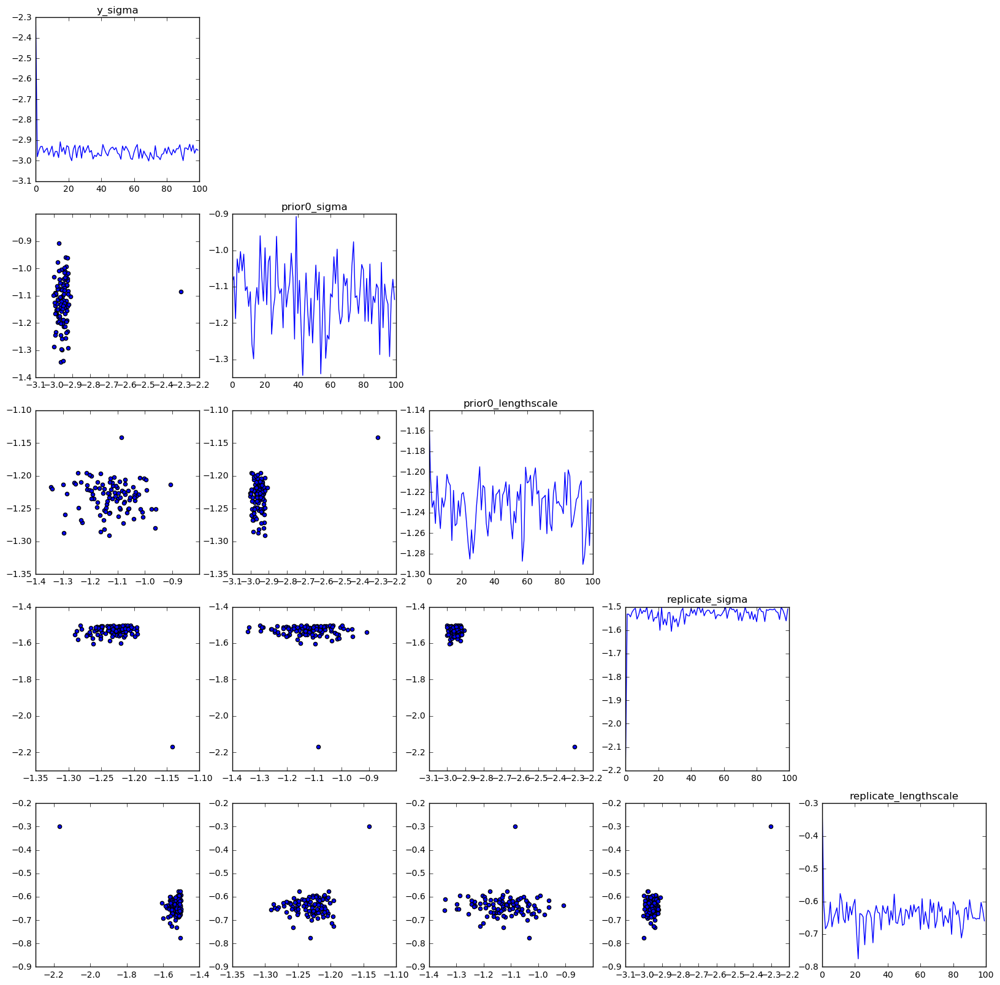

In [78]:
params = ['y_sigma','prior0_sigma','prior0_lengthscale','replicate_sigma','replicate_lengthscale']

plt.figure(figsize=(len(params)*4,len(params)*4))
for i,p in enumerate(params):
    plt.subplot(len(params),len(params),i+1+i*len(params))
    plt.title(p)
    plt.plot(m_withReplicate.parameter_history[p])
    
    for j,p2 in enumerate(params[:i]):
        plt.subplot(len(params),len(params),i+1+i*len(params)-j-1)
        plt.scatter(m_withReplicate.parameter_history[p2],m_withReplicate.parameter_history[p])

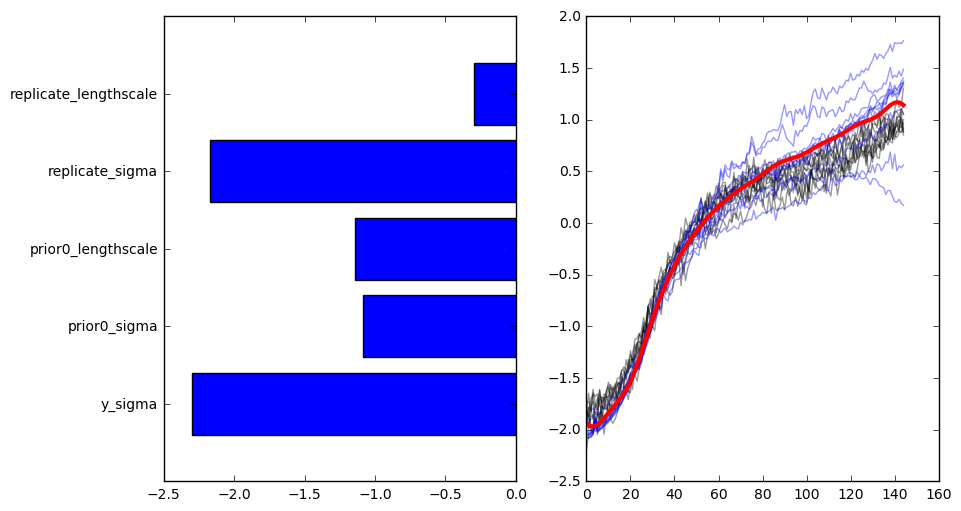

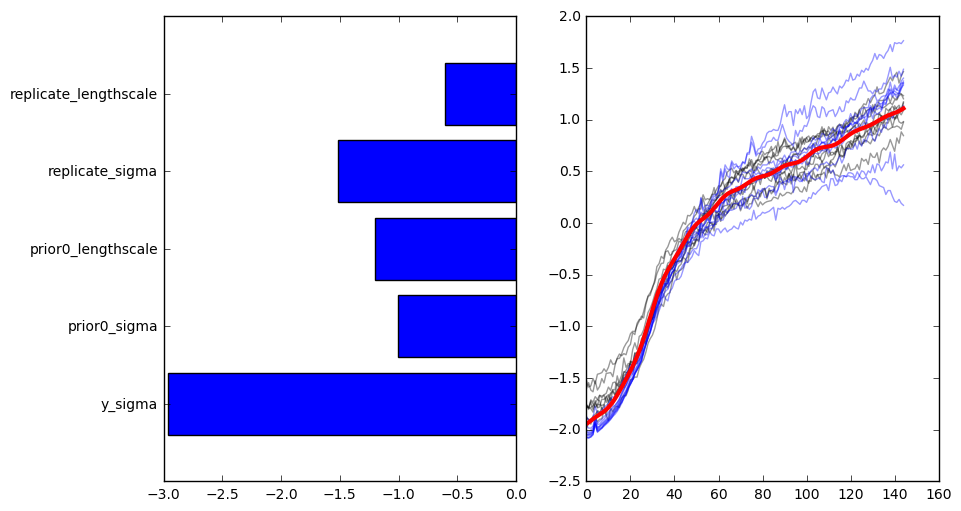

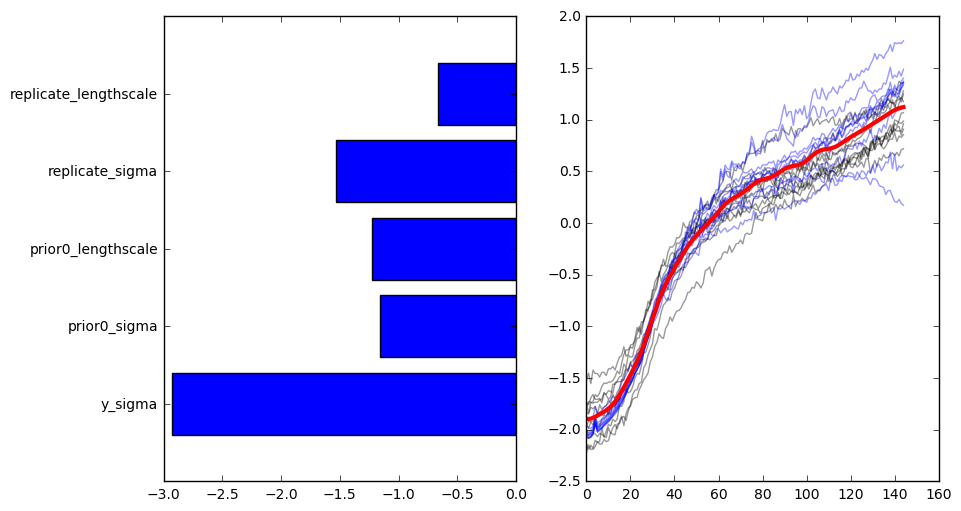

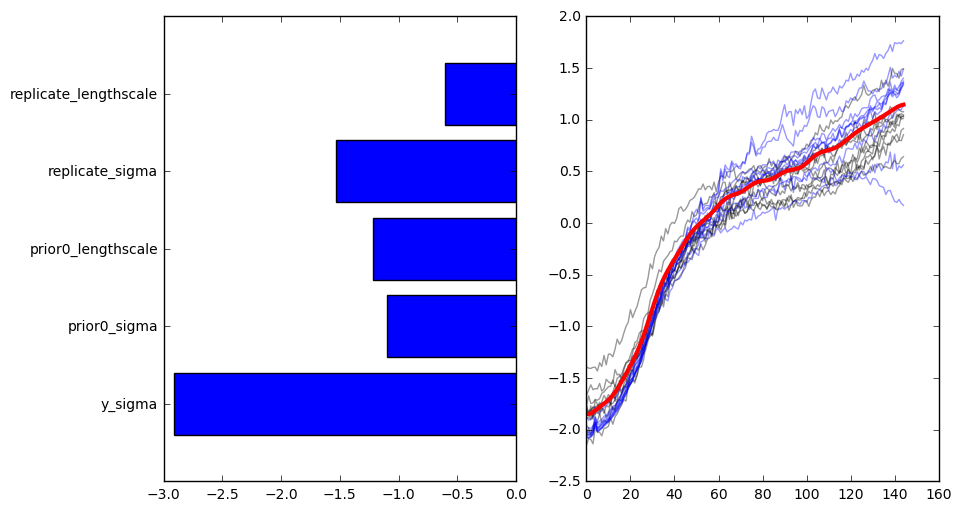

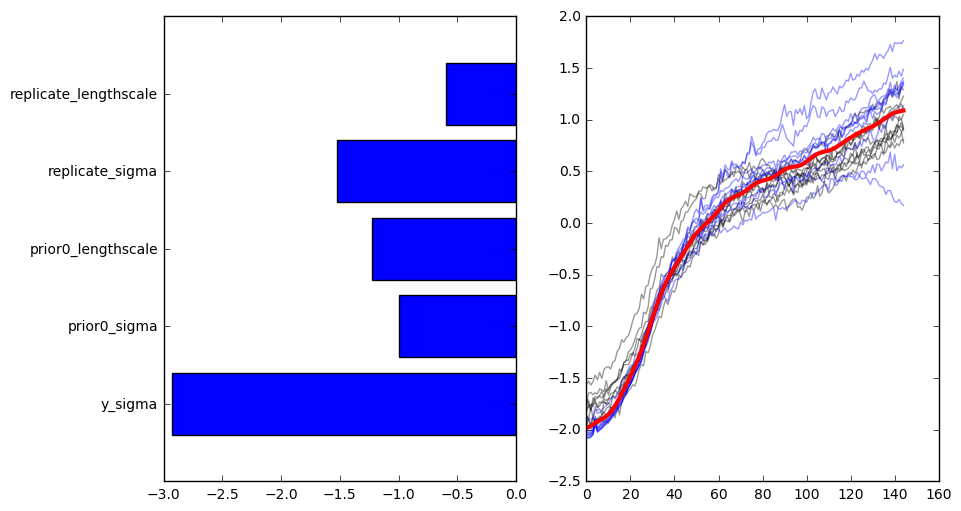

...

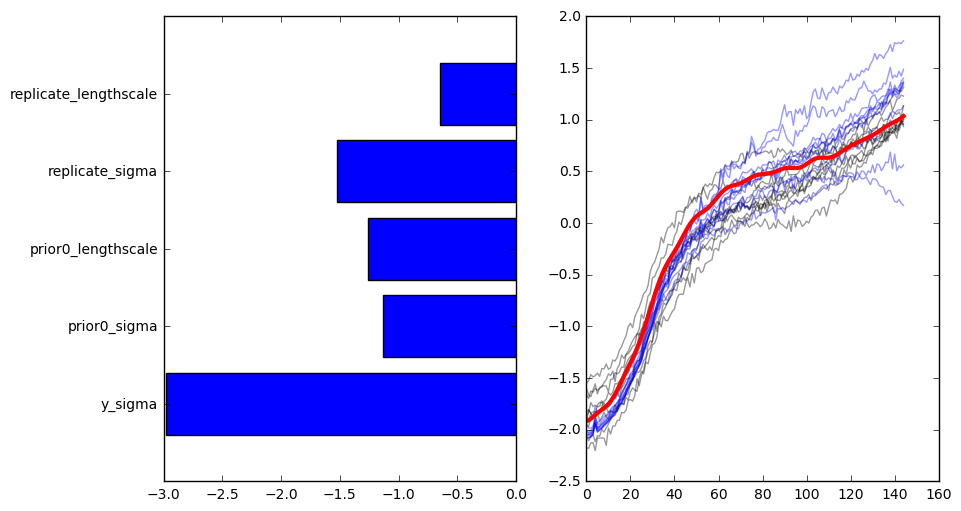

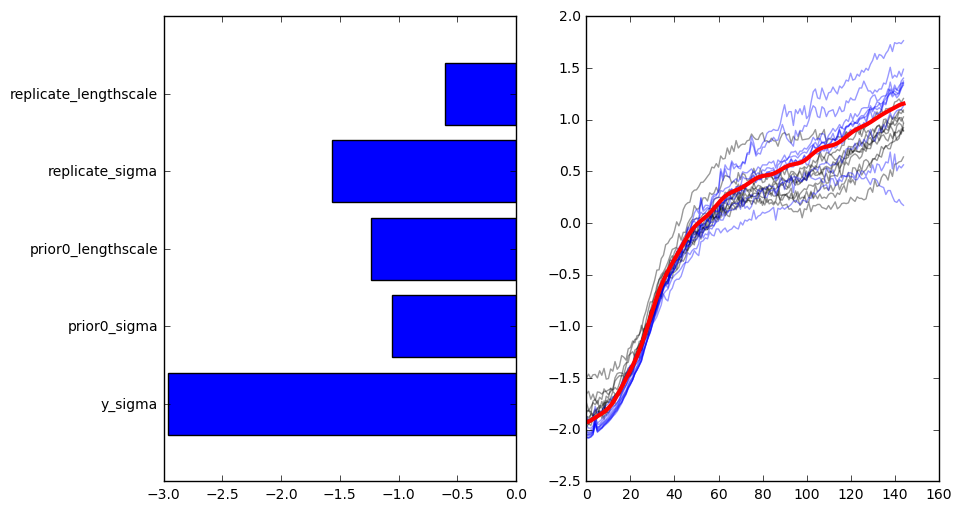

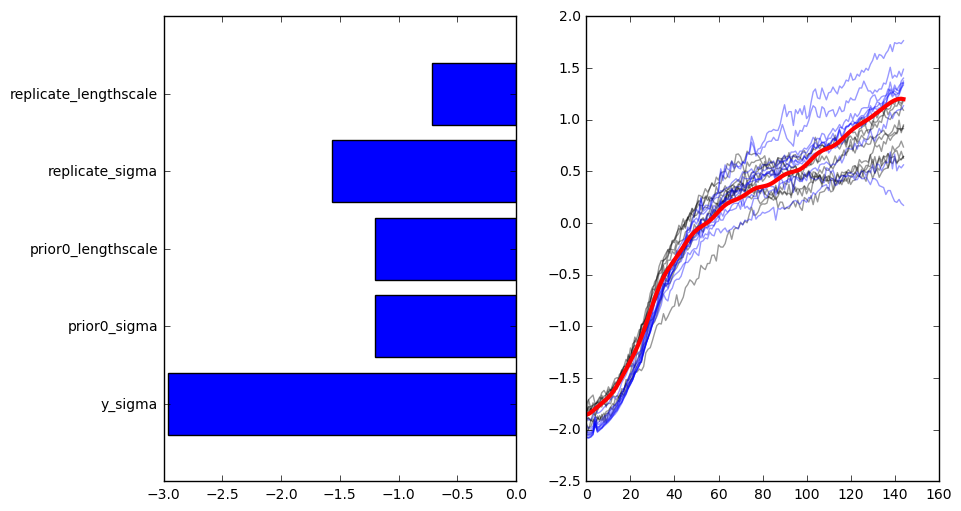

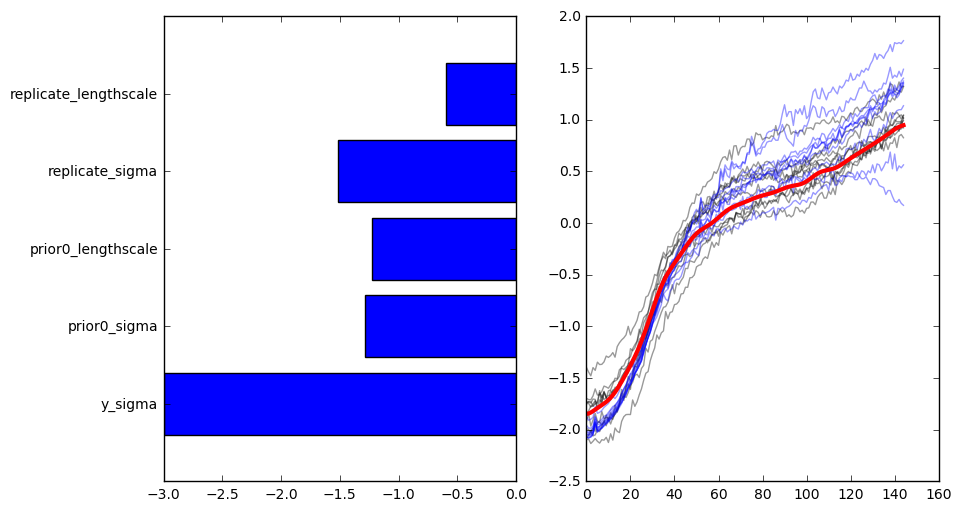

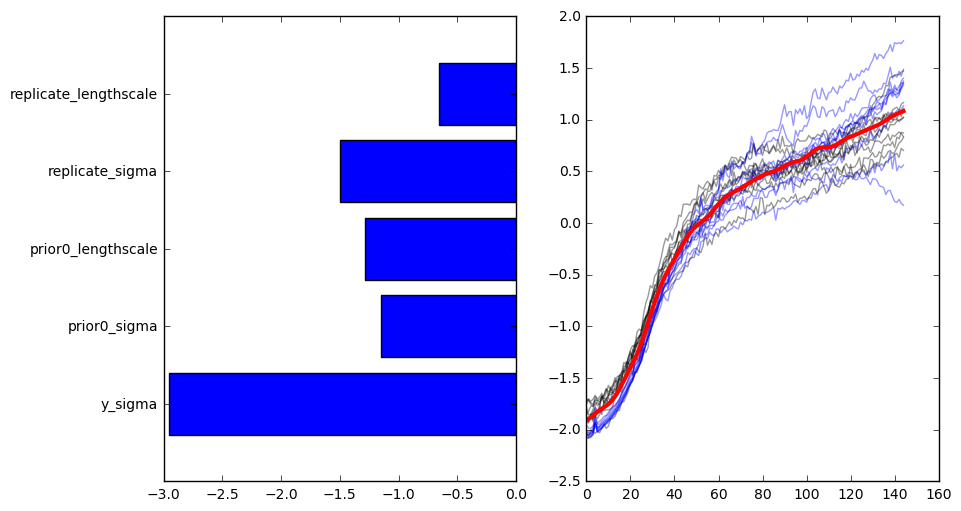

In [118]:
for i in range(0,m_withReplicate.parameter_history.shape[0],int(m_withReplicate.parameter_history.shape[0]*.05)):

    m_withReplicate.parameter_cache = m_withReplicate.parameter_history.iloc[i,:]
    
    plt.figure(figsize=(10,6))
    
    plt.subplot(122)
    cov = m_withReplicate.y_k.K(m_withReplicate.x)
    ysample = np.dot(m_withReplicate.design_matrix,m_withReplicate.functionSamples(0).values[-1,:][None,:]) +\
                scipy.stats.multivariate_normal.rvs(np.zeros(m_withReplicate.n),cov,size=m_withReplicate.m)

    fsample = m_withReplicate.functionMatrix()

    plt.plot(ysample.T,c='k',alpha=.4); 
    plt.plot(y,c='b',alpha=.4); 
    plt.plot(fsample,c='r',lw=3);
    
    plt.subplot(121)
    params = ['y_sigma','prior0_sigma','prior0_lengthscale','replicate_sigma','replicate_lengthscale']
    plt.barh(range(len(params)),m_withReplicate.parameter_cache[params],align='center',tick_label=params)
    
    plt.savefig('figures/ura3-pq-replicate/model-withReplicate/sample-%d.pdf'%i,bbox_inches='tight')

In [80]:
m_withReplicate2 = gpfanova.base.Base_withReplicate(x,y,designMatrix=dm,priorGroups=[[0]],
                                     replicateSigmaBounds=(-4,4),
                                     replicateLengthscaleBounds=(-1,1),
                                     bounds={'y_sigma':(-4,2),'prior0_sigma':(-2,2)})

In [81]:
m_withReplicate2.sample(1000,thin=10,random=True)

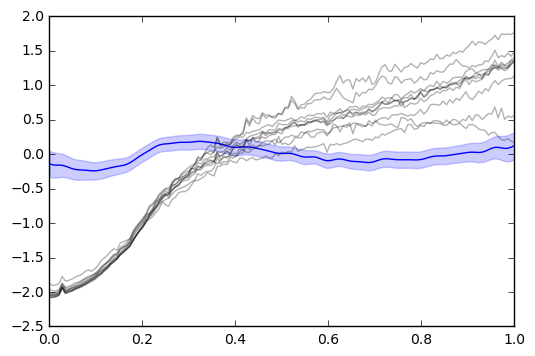

In [142]:
gpfanova.plot.plotFunctionSamples(m_withReplicate2.functionSamples(0).values,x=x[:,0])
plt.plot(x[:,0],y,c='k',alpha=.3);
plt.savefig("figures/ura3-pq-replicate/model-withReplicate2.pdf",bbox_inches='tight')

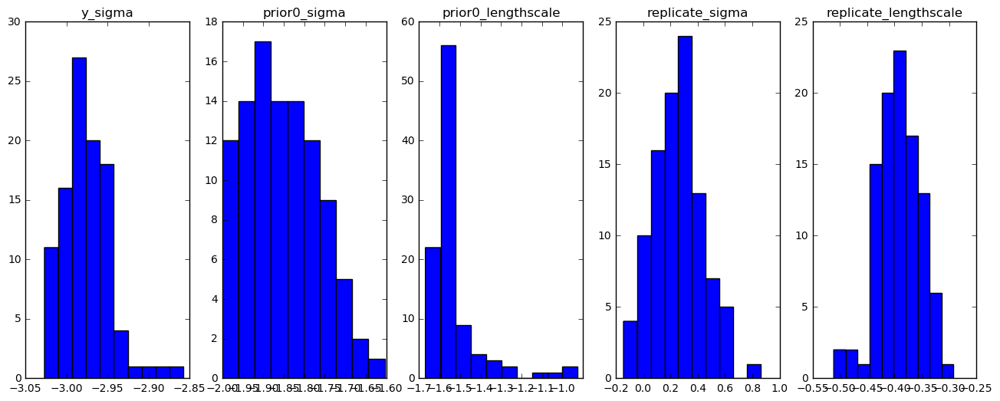

In [112]:
plt.figure(figsize=(16,6))
for i,p in enumerate(['y_sigma','prior0_sigma','prior0_lengthscale','replicate_sigma','replicate_lengthscale']):            
    plt.subplot(1,5,i+1); plt.title(p)
    plt.hist(m_withReplicate2.parameter_history[p])

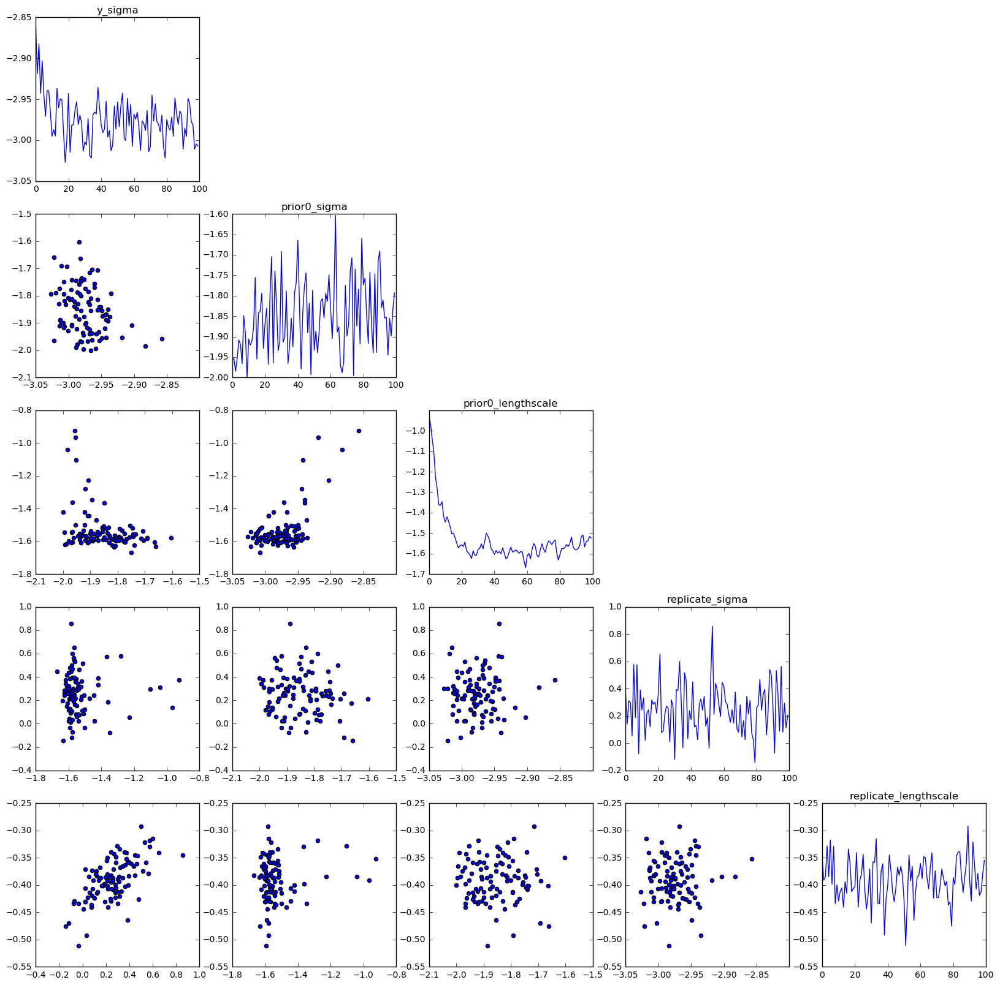

In [114]:
params = ['y_sigma','prior0_sigma','prior0_lengthscale','replicate_sigma','replicate_lengthscale']

plt.figure(figsize=(len(params)*4,len(params)*4))
for i,p in enumerate(params):
    plt.subplot(len(params),len(params),i+1+i*len(params))
    plt.title(p)
    plt.plot(m_withReplicate2.parameter_history[p])
    
    for j,p2 in enumerate(params[:i]):
        plt.subplot(len(params),len(params),i+1+i*len(params)-j-1)
        plt.scatter(m_withReplicate2.parameter_history[p2],m_withReplicate2.parameter_history[p])

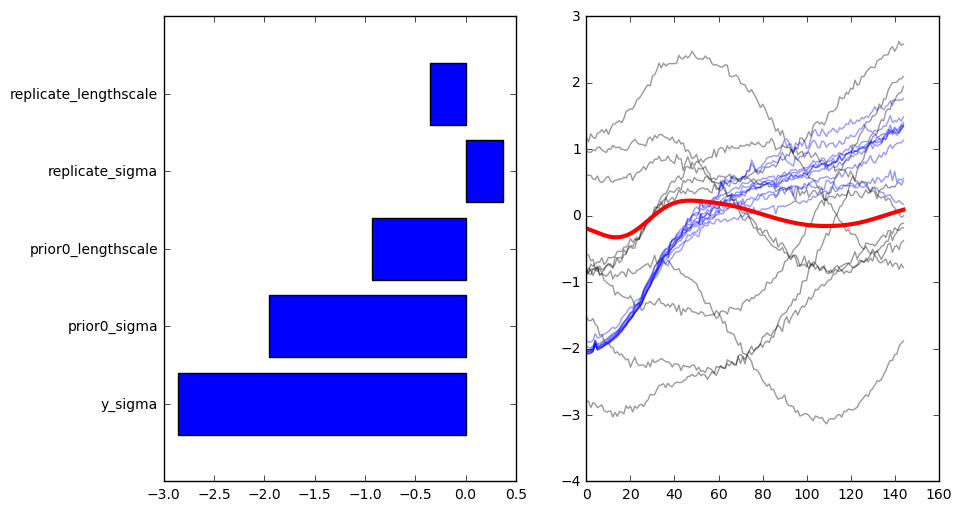

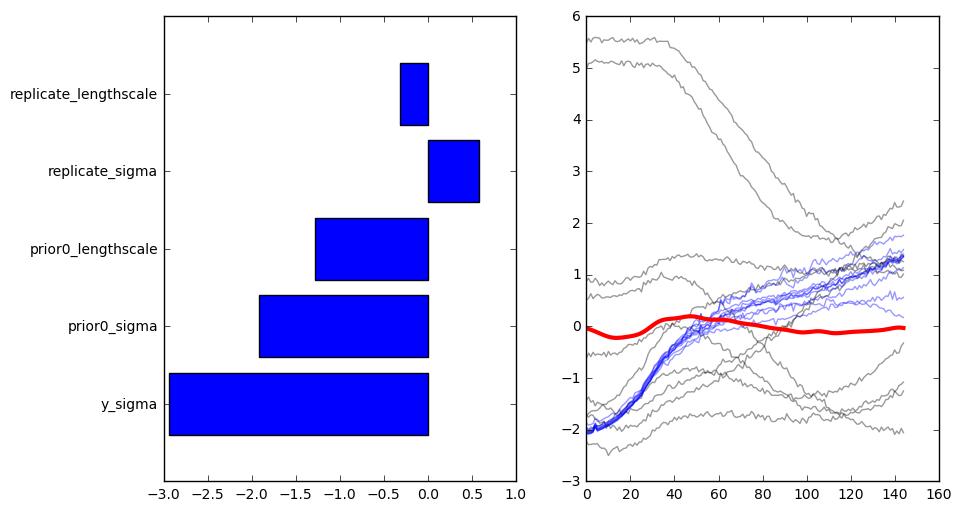

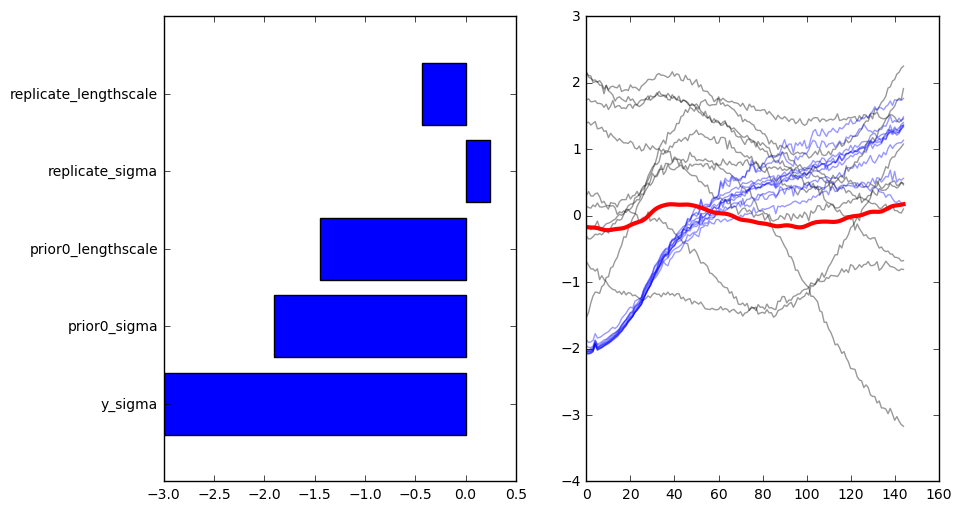

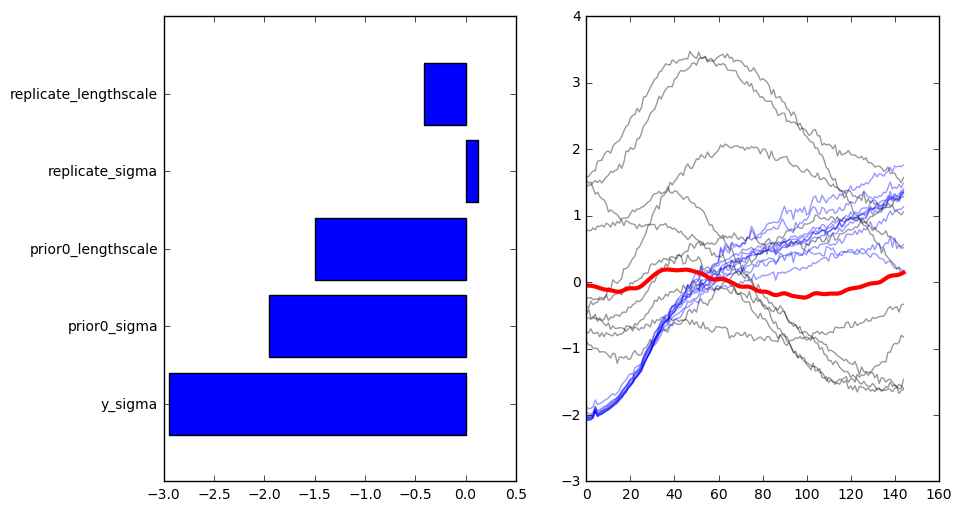

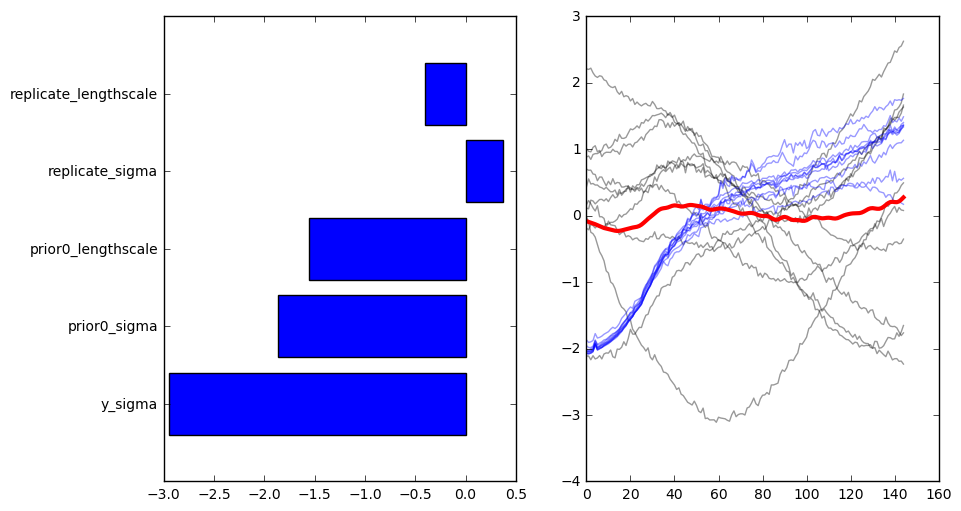

...

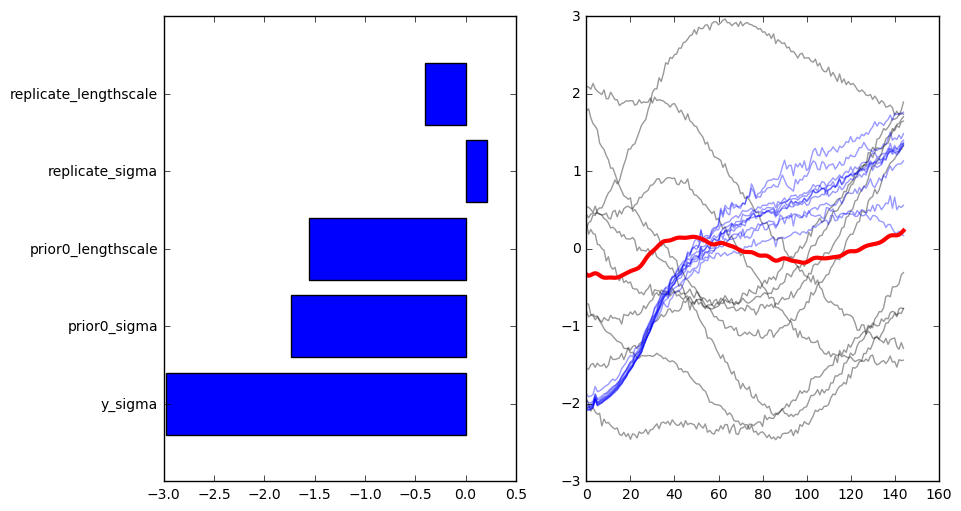

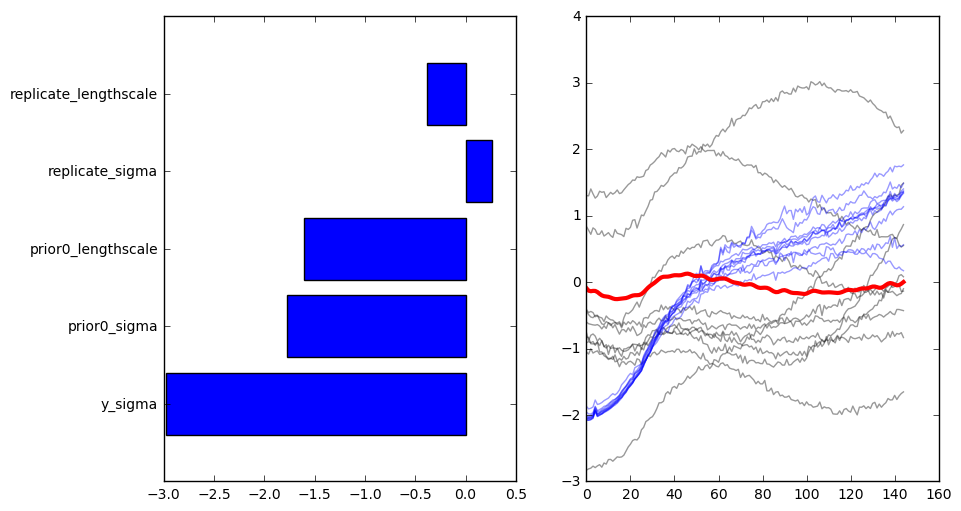

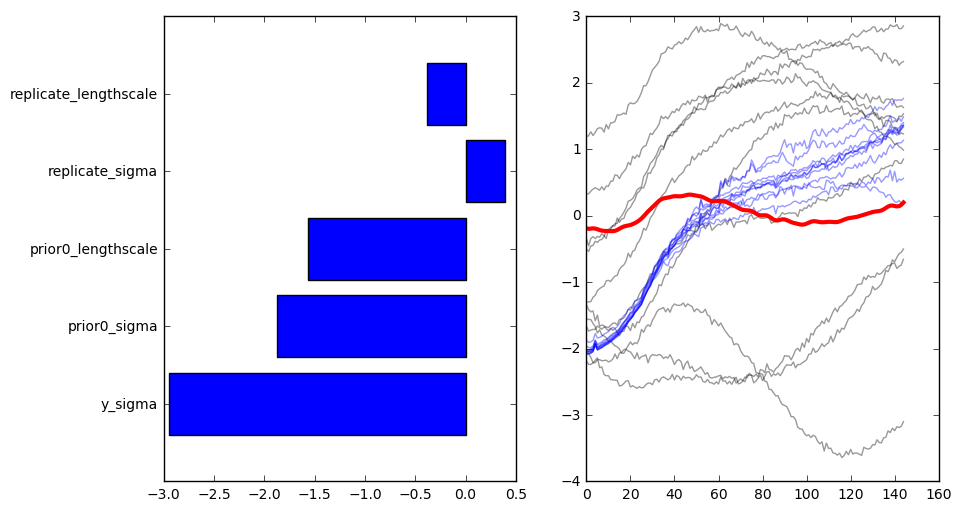

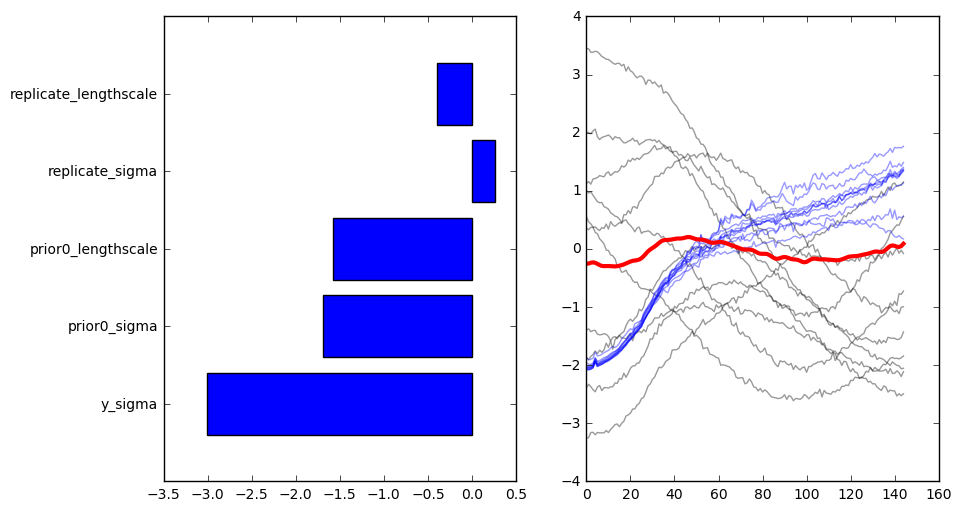

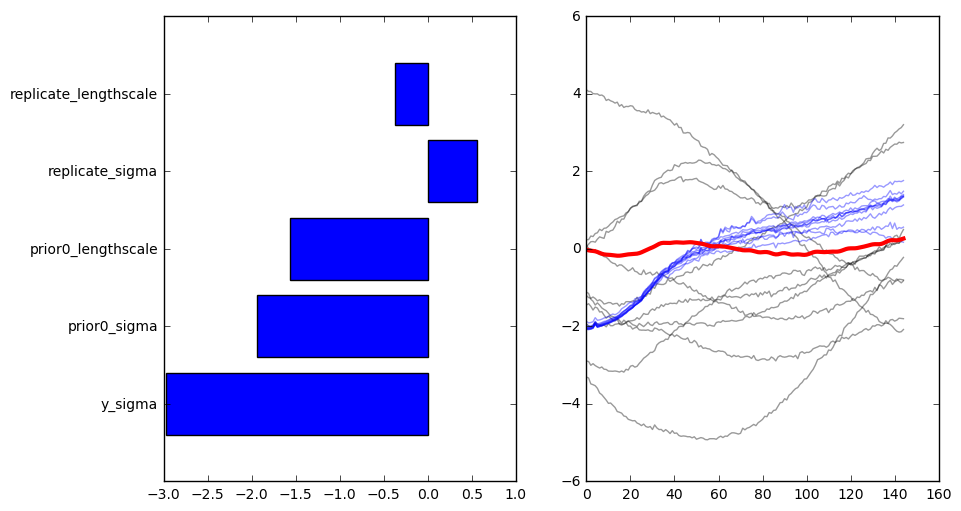

In [143]:
for i in range(0,m_withReplicate2.parameter_history.shape[0],int(m_withReplicate2.parameter_history.shape[0]*.05)):

    m_withReplicate2.parameter_cache = m_withReplicate2.parameter_history.iloc[i,:]
    
    plt.figure(figsize=(10,6))
    
    plt.subplot(122)
    cov = m_withReplicate2.y_k.K(m_withReplicate.x)
    ysample = np.dot(m_withReplicate2.design_matrix,m_withReplicate2.functionSamples(0).values[-1,:][None,:]) +\
                scipy.stats.multivariate_normal.rvs(np.zeros(m_withReplicate2.n),cov,size=m_withReplicate2.m)

    fsample = m_withReplicate2.functionMatrix()

    plt.plot(ysample.T,c='k',alpha=.4); 
    plt.plot(y,c='b',alpha=.4); 
    plt.plot(fsample,c='r',lw=3);
    
    plt.subplot(121)
    params = ['y_sigma','prior0_sigma','prior0_lengthscale','replicate_sigma','replicate_lengthscale']
    plt.barh(range(len(params)),m_withReplicate2.parameter_cache[params],align='center',tick_label=params)
    
    plt.savefig('figures/ura3-pq-replicate/model-withReplicate2/sample-%d.pdf'%i,bbox_inches='tight')

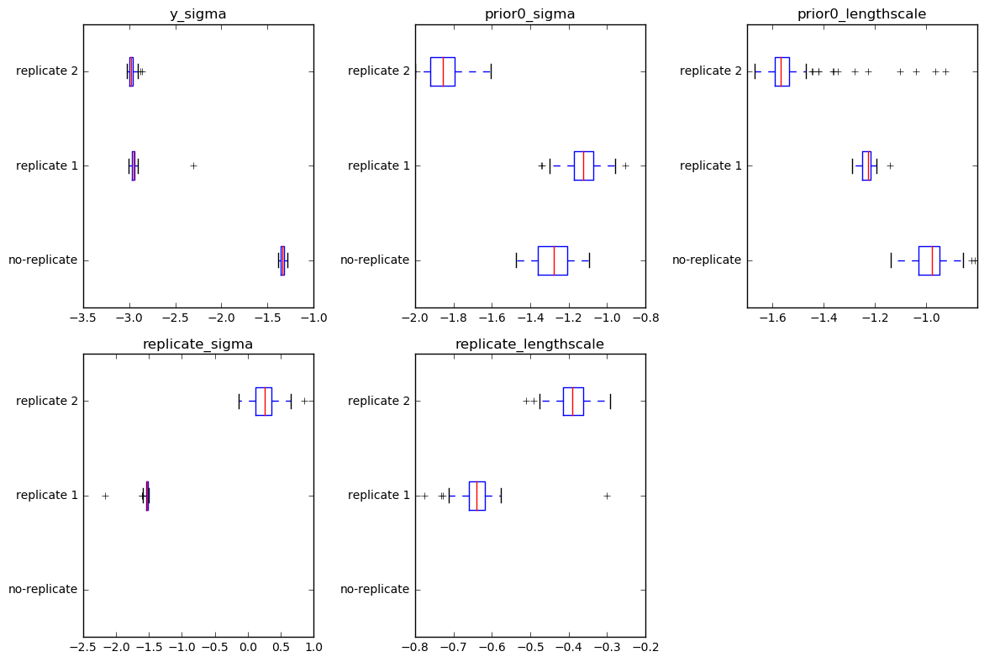

In [141]:
plt.figure(figsize=(12,8))
for i,p in enumerate(['y_sigma','prior0_sigma','prior0_lengthscale','replicate_sigma','replicate_lengthscale']):            
    plt.subplot(2,3,i+1); 
    plt.title(p)
    
    samples = [m.parameter_history[p] if p in m.parameter_history else [] for m in m_noReplicate,m_withReplicate,m_withReplicate2 ]
    #plt.barh(range(3),[z.mean() for z in samples], xerr = [2*z.std() for z in samples],
    #         tick_label=['no-replicate','replicate 1', 'replicate 2'],align='center')
    plt.boxplot(samples,vert=False,
             labels=['no-replicate','replicate 1', 'replicate 2'])

plt.tight_layout()

plt.savefig("figures/ura3-pq-replicate/comparison.pdf",bbox_inches='tight')

In [145]:
m_withReplicate2.samplers

[y_sigma (Slice): y_sigma,
 f0 (Function): f0([ 0.]), f0([ 0.00694444]), f0([ 0.01388889]), ...,
 prior0_sigma (Slice): prior0_sigma,
 prior0_lengthscale (Slice): prior0_lengthscale,
 replicate_sigma (Slice): replicate_sigma,
 replicate_lengthscale (Slice): replicate_lengthscale]

In [151]:
m_withReplicate2.samplers[-2].logdensity_fxn(-1.5)

1447.9198521986834

In [163]:
m_withReplicate3 = gpfanova.base.Base_withReplicate(x,y,designMatrix=dm,priorGroups=[[0]],
                                     replicateSigmaBounds=(-4,2),
                                     replicateLengthscaleBounds=(-1,1),
                                     bounds={'y_sigma':(-4,2),'prior0_sigma':(-2,2)})
m_withReplicate3.parameter_cache = m_withReplicate.parameter_cache

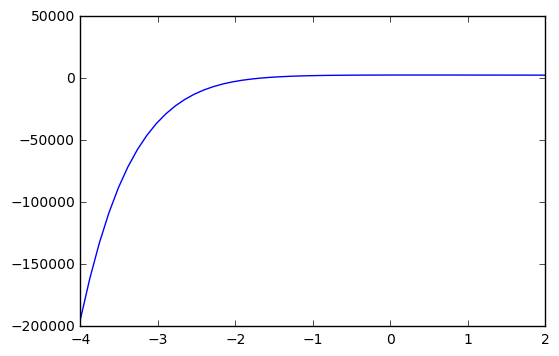

In [164]:
z = np.linspace(-4,2)
plt.plot(z,[m_withReplicate3.samplers[-2].logdensity_fxn(i) for i in z])

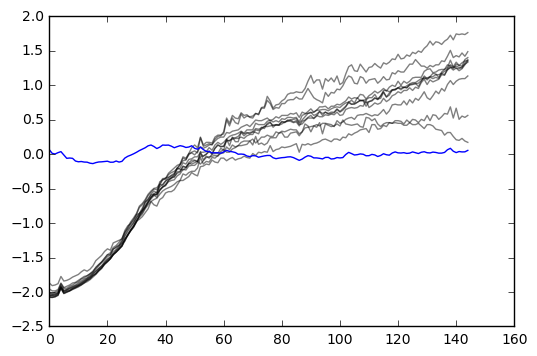

In [167]:
plt.plot(y,c='k',alpha=.5); plt.plot(m_withReplicate.functionMatrix())

In [156]:
m_withReplicate3.sample(1000,thin=10)

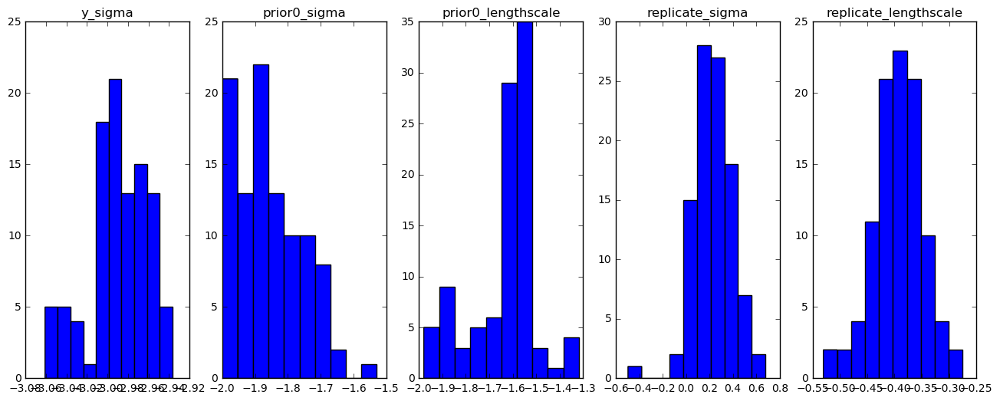

In [157]:
plt.figure(figsize=(16,6))
for i,p in enumerate(['y_sigma','prior0_sigma','prior0_lengthscale','replicate_sigma','replicate_lengthscale']):            
    plt.subplot(1,5,i+1); plt.title(p)
    plt.hist(m_withReplicate3.parameter_history[p])

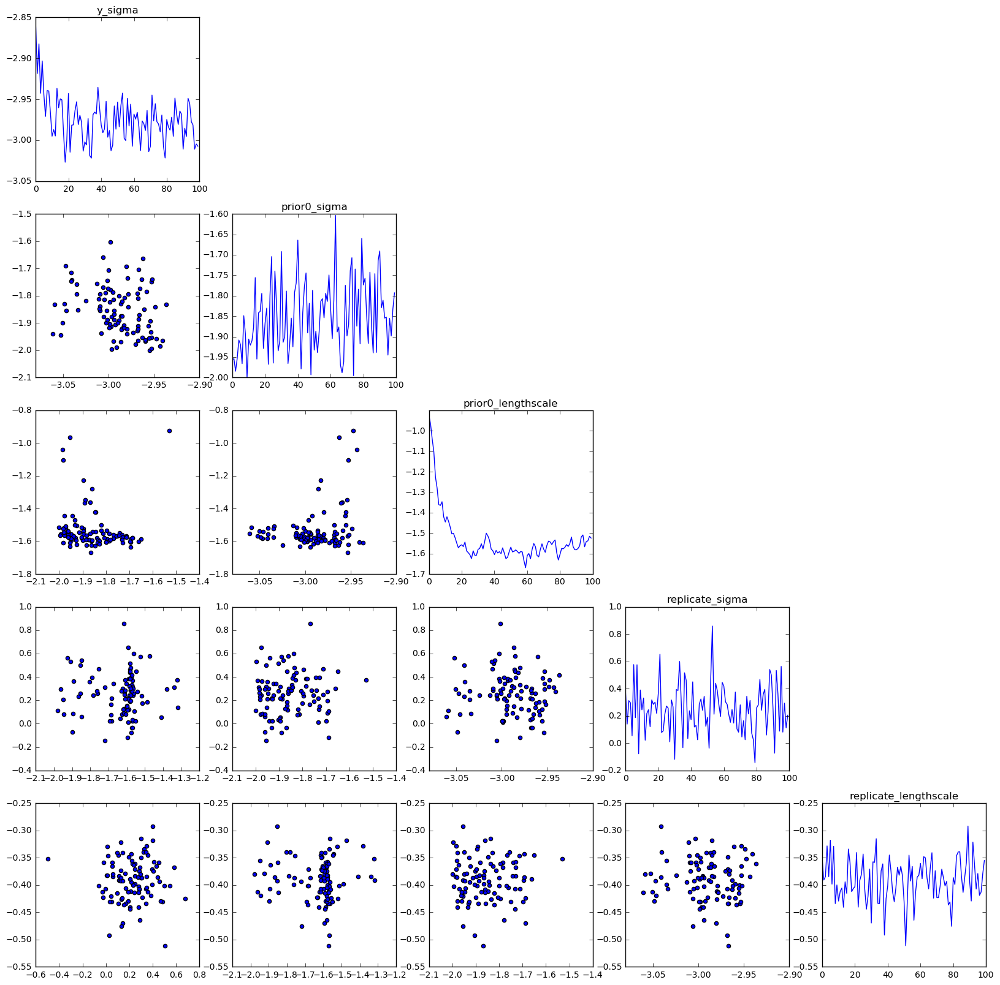

In [158]:
params = ['y_sigma','prior0_sigma','prior0_lengthscale','replicate_sigma','replicate_lengthscale']

plt.figure(figsize=(len(params)*4,len(params)*4))
for i,p in enumerate(params):
    plt.subplot(len(params),len(params),i+1+i*len(params))
    plt.title(p)
    plt.plot(m_withReplicate3.parameter_history[p])
    
    for j,p2 in enumerate(params[:i]):
        plt.subplot(len(params),len(params),i+1+i*len(params)-j-1)
        plt.scatter(m_withReplicate3.parameter_history[p2],m_withReplicate3.parameter_history[p])

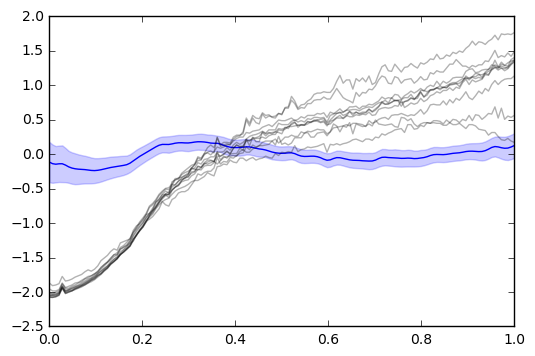

In [159]:
gpfanova.plot.plotFunctionSamples(m_withReplicate3.functionSamples(0).values,x=x[:,0])
plt.plot(x[:,0],y,c='k',alpha=.3);
# plt.savefig("figures/ura3-pq-replicate/model-withReplicate2.pdf",bbox_inches='tight')

# Explicit replicate 

In [41]:
import patsy

In [277]:
# dm_effect = np.column_stack((np.ones(y.shape[1]),patsy.contrasts.Helmert().code_without_intercept(range(y.shape[1])).matrix)) 
dm_effect = np.column_stack((np.ones(y.shape[1]),patsy.contrasts.Sum().code_without_intercept(range(y.shape[1])).matrix)) 
dm_effect

array([[ 1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.],
       [ 1., -1., -1., -1., -1., -1., -1., -1., -1., -1.]])

In [278]:
dm_effect.shape

(10, 10)

In [315]:
# m_replicateEffect = gpfanova.base.Base(x,y,designMatrix=dm_effect,priorGroups=[range(dm_effect.shape[1])])
m_replicateEffect = gpfanova.base.Base(x,y,
                                       designMatrix=dm_effect,
                                       priorGroups=[[0]]+[range(1,dm_effect.shape[1])],
                                       bounds = {'y_sigma':(-4,2),
                                                 'prior0_sigma':(-4,2),
                                                 'prior1_sigma':(-4,2),
                                                })

In [316]:
m_replicateEffect.sample(1000,thin=10)

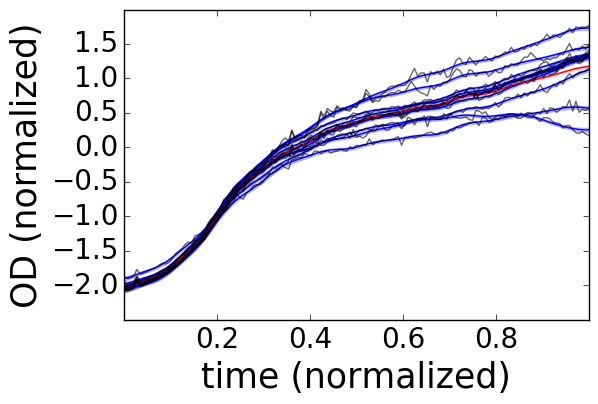

In [317]:
plt.figure(figsize=(6,4))

tensor = np.array([m_replicateEffect.functionSamples(i).values.T for i in range(m_replicateEffect.f)])

for r in range(y.shape[1]):
    samp = np.dot(tensor.T,m_replicateEffect.design_matrix[r,:])
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0])
    
gpfanova.plot.plotFunctionSamples(m_replicateEffect.functionSamples(0).values,x=x[:,0],c='r')
plt.plot(x[:,0],y,c='k',alpha=.6);

plt.xlabel("time (normalized)",fontsize=25)
plt.ylabel("OD (normalized)",fontsize=25)
plt.xticks(np.arange(.2,1,.2),fontsize=20)
plt.yticks(np.arange(-2,2,.5),fontsize=20)

plt.savefig("figures/ura3-pq-replicate/model-explicitReplicate-singleReplicate.pdf",bbox_inches='tight',dpi=300)

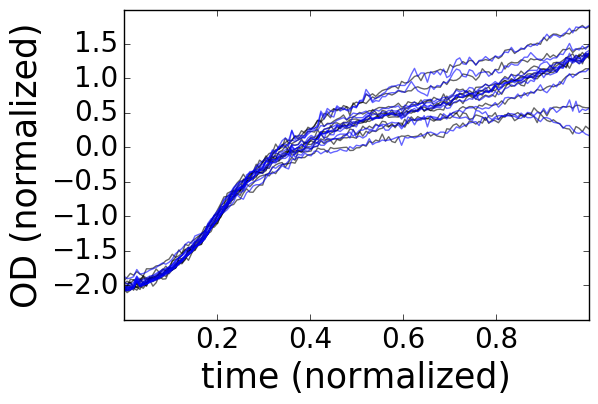

In [318]:
plt.figure(figsize=(6,4))

tensor = np.array([m_replicateEffect.functionSamples(i).values.T for i in range(m_replicateEffect.f)])

for r in range(y.shape[1]):
    mu = np.dot(tensor.T,m_replicateEffect.design_matrix[r,:]).mean(0)
    cov = m_replicateEffect.y_k.K(x)
    samp = scipy.stats.multivariate_normal.rvs(mu,cov)
    plt.plot(x[:,0],samp,c='k',alpha=.6)
    #gpfanova.plot.plotFunctionSamples(samp,x=x[:,0])
    
# gpfanova.plot.plotFunctionSamples(m_replicateEffect.functionSamples(0).values,x=x[:,0],c='r')
plt.plot(x[:,0],y,c='b',alpha=.6);

plt.xlabel("time (normalized)",fontsize=25)
plt.ylabel("OD (normalized)",fontsize=25)
plt.xticks(np.arange(.2,1,.2),fontsize=20)
plt.yticks(np.arange(-2,2,.5),fontsize=20)

plt.savefig("figures/ura3-pq-replicate/model-explicitReplicate-generative-singleReplicate.pdf",bbox_inches='tight',dpi=300)

In [319]:
mu.shape,cov.shape,x.shape,samp.shape

((145,), (145, 145), (145, 1), (145,))

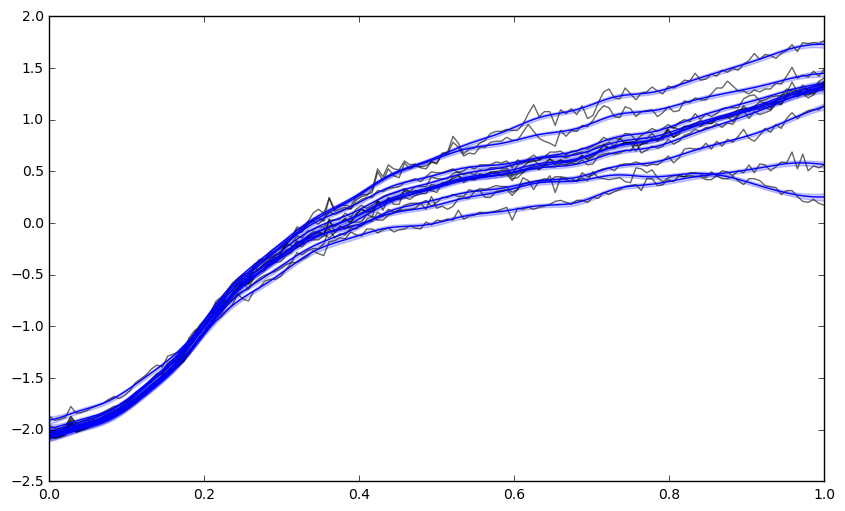

In [320]:
plt.figure(figsize=(10,6))

plt.plot(x[:,0],y,c='k',alpha=.6);

tensor = np.array([m_replicateEffect.functionSamples(i).values.T for i in range(m_replicateEffect.f)])

for r in range(y.shape[1]):
    samp = np.dot(tensor.T,m_replicateEffect.design_matrix[r,:])
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0])

(array([-1. , -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8]),
 <a list of 10 Text yticklabel objects>)

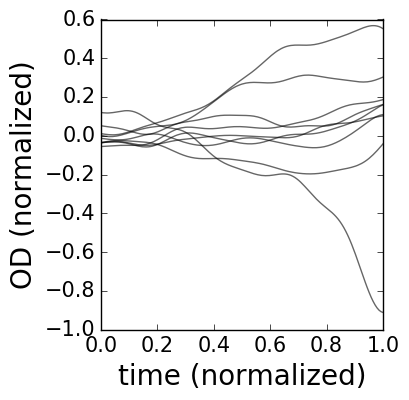

In [321]:
plt.figure(figsize=(8,4))

plt.subplot(121)
plt.plot(x,m_replicateEffect.functionMatrix()[:,1:],c='k',alpha=.6)

plt.xlabel("time (normalized)",fontsize=20)
plt.ylabel("OD (normalized)",fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

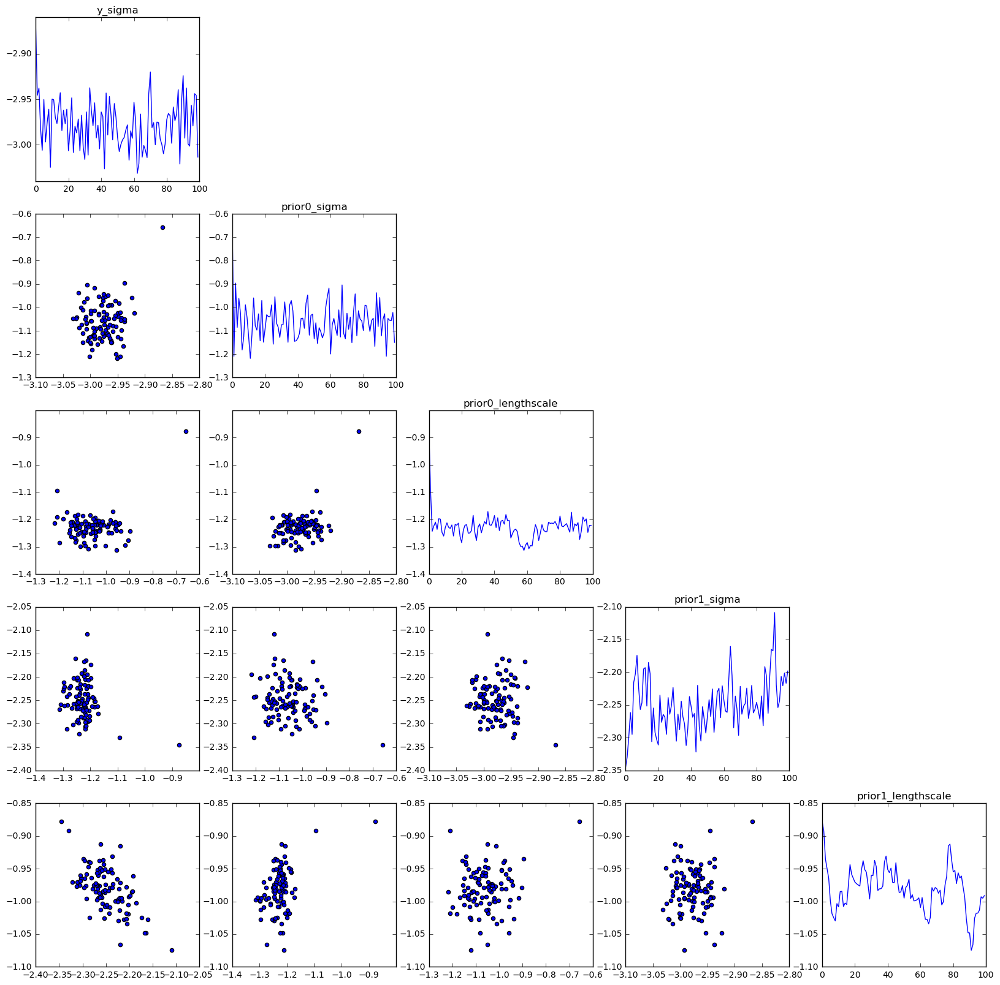

In [322]:
params = ['y_sigma','prior0_sigma','prior0_lengthscale','prior1_sigma','prior1_lengthscale']

plt.figure(figsize=(len(params)*4,len(params)*4))
for i,p in enumerate(params):
    plt.subplot(len(params),len(params),i+1+i*len(params))
    plt.title(p)
    plt.plot(m_replicateEffect.parameter_history[p])
    
    for j,p2 in enumerate(params[:i]):
        plt.subplot(len(params),len(params),i+1+i*len(params)-j-1)
        plt.scatter(m_replicateEffect.parameter_history[p2],m_replicateEffect.parameter_history[p])

In [323]:
m_replicateEffect.kernels

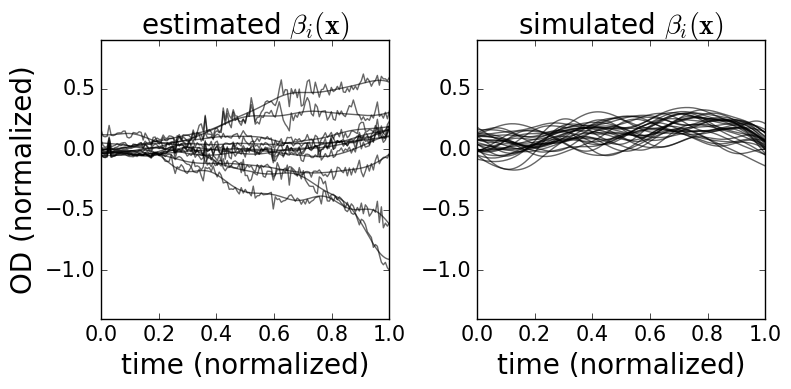

In [328]:


plt.figure(figsize=(8,4))

plt.subplot(121)
for r in range(y.shape[1]):
    plt.plot(x,np.dot(m_replicateEffect.functionMatrix()[:,1:],m_replicateEffect.design_matrix[r,1:]),
             c='k',alpha=.6)
    
plt.plot(x,y-m_replicateEffect.functionMatrix()[:,0][:,None],
         c='k',alpha=.6)

plt.xlabel("time (normalized)",fontsize=20)
plt.ylabel("OD (normalized)",fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(-1.4,.9)

plt.title("estimated $\\beta_i(\mathbf{x})$",fontsize=20)

cov = m_replicateEffect.kernels[1].K(x)

plt.subplot(122)
for r in range(y.shape[1]*3):
    repSamp = scipy.stats.multivariate_normal.rvs(np.zeros(m_replicateEffect.n),cov)
    repSamp -= m_replicateEffect.functionMatrix()[:,-1]
    plt.plot(x,repSamp,c='k',alpha=.6)
    
plt.ylim(-1.4,.9)
plt.title("simulated $\\beta_i(\mathbf{x})$",fontsize=20)

plt.xlabel("time (normalized)",fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.tight_layout()

# plt.savefig("figures/ura3-pq-replicate/model-randomEffects-replicateSample-singleReplicate.pdf",bbox_inches='tight')

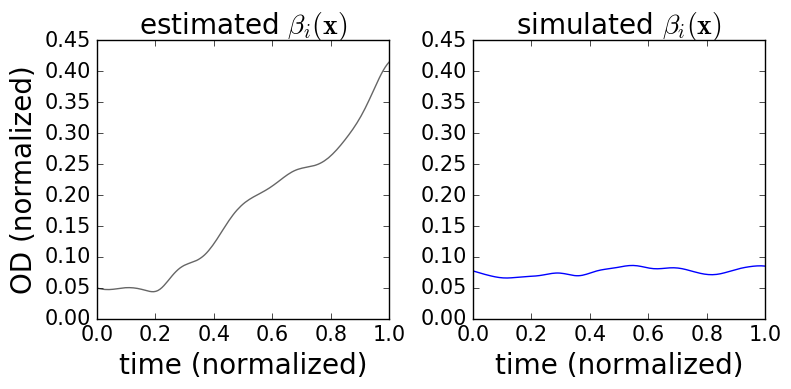

In [339]:


plt.figure(figsize=(8,4))

plt.subplot(121)
#for r in range(y.shape[1]):
var = np.dot(m_replicateEffect.functionMatrix()[:,1:],m_replicateEffect.design_matrix[:,1:].T).std(1)
plt.plot(x,var,
             c='k',alpha=.6)
    
# plt.plot(x,y-m_replicateEffect.functionMatrix()[:,0][:,None],
#          c='k',alpha=.6)

plt.xlabel("time (normalized)",fontsize=20)
plt.ylabel("OD (normalized)",fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
# plt.ylim(-1.4,.9)

plt.title("estimated $\\beta_i(\mathbf{x})$",fontsize=20)

cov = m_replicateEffect.kernels[1].K(x)

plt.subplot(122)
samps = []
for r in range(y.shape[1]*3):
    repSamp = scipy.stats.multivariate_normal.rvs(np.zeros(m_replicateEffect.n),cov)
    repSamp -= m_replicateEffect.functionMatrix()[:,-1]
    samps.append(repSamp)
plt.plot(x,np.array(samps).std(0))

plt.ylim(0,.45)

plt.title("simulated $\\beta_i(\mathbf{x})$",fontsize=20)

plt.xlabel("time (normalized)",fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.tight_layout()

# plt.savefig("figures/ura3-pq-replicate/model-randomEffects-replicateSample-singleReplicate.pdf",bbox_inches='tight')

# Random effect 

In [63]:
dm_randomeffect = np.column_stack((np.ones(y.shape[1]),np.eye(y.shape[1])))
dm_randomeffect

array([[ 1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.],
       [ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]])

In [243]:
m_randomEffect = gpfanova.base.Base(x,y,designMatrix=dm_randomeffect,
                                    priorGroups=[[0],range(1,dm_randomeffect.shape[1])],
                                    bounds={'y_sigma':(-4,0)})

ERROR:gpfanova.base:design matrix is of rank 10, but there are 11 functions!


In [244]:
m_randomEffect.sample(1000,thin=10)

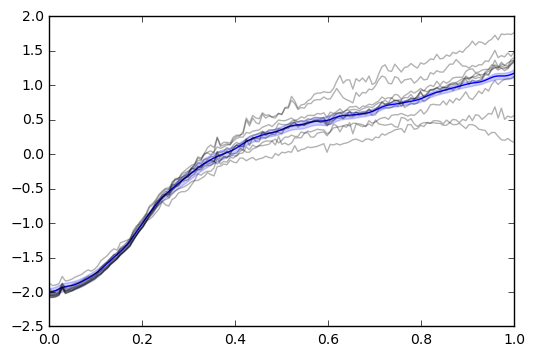

In [245]:
gpfanova.plot.plotFunctionSamples(m_randomEffect.functionSamples(0).values,x=x[:,0])
plt.plot(x[:,0],y,c='k',alpha=.3);

(0, 0.2)

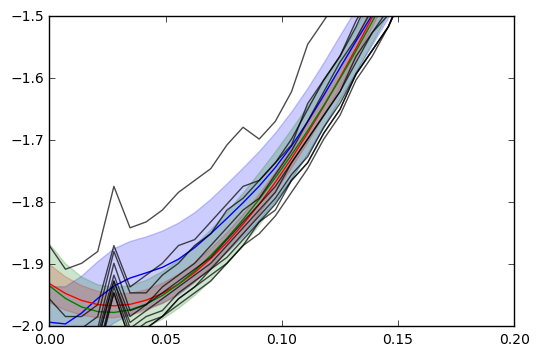

In [246]:
gpfanova.plot.plotFunctionSamples(m_randomEffect.functionSamples(0).values,x=x[:,0])
gpfanova.plot.plotFunctionSamples(m_replicateEffect.functionSamples(0).values,x=x[:,0],c='r')
gpfanova.plot.plotFunctionSamples(m_noReplicate.functionSamples(0).values,x=x[:,0],c='g')
plt.plot(x[:,0],y,c='k',alpha=.7);

plt.ylim(-.5,.5)
plt.xlim(.2,.6)

plt.ylim(-2,-1.5)
plt.xlim(0,.2,)

In [247]:
m_randomEffect.functionSamples(0).values.std(0).mean(),m_noReplicate.functionSamples(0).values.std(0).mean(),m_replicateEffect.functionSamples(0).values.std(0).mean()

(0.024637264113262537, 0.019672754702256993, 0.0084694223441122863)

([<matplotlib.axis.YTick at 0x7effe9efd6d0>,
 <a list of 8 Text yticklabel objects>)

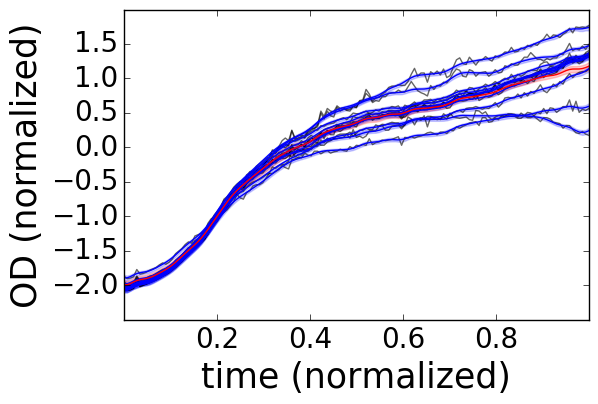

In [248]:
plt.figure(figsize=(6,4))

plt.plot(x[:,0],y,c='k',alpha=.6);

for r in range(y.shape[1]):
    gpfanova.plot.plotFunctionSamples(m_randomEffect.functionSamples(0).values+
                                      m_randomEffect.functionSamples(1+r).values,x=x[:,0])
    
gpfanova.plot.plotFunctionSamples(m_randomEffect.functionSamples(0).values,x=x[:,0],c='r')

plt.xlabel("time (normalized)",fontsize=25)
plt.ylabel("OD (normalized)",fontsize=25)
plt.xticks(np.arange(.2,1,.2),fontsize=20)
plt.yticks(np.arange(-2,2,.5),fontsize=20)

# plt.savefig("figures/ura3-pq-replicate/model-randomEffect-singleReplicate.pdf",bbox_inches='tight',dpi=300)

([<matplotlib.axis.YTick at 0x7effeac1c290>,
 <a list of 8 Text yticklabel objects>)

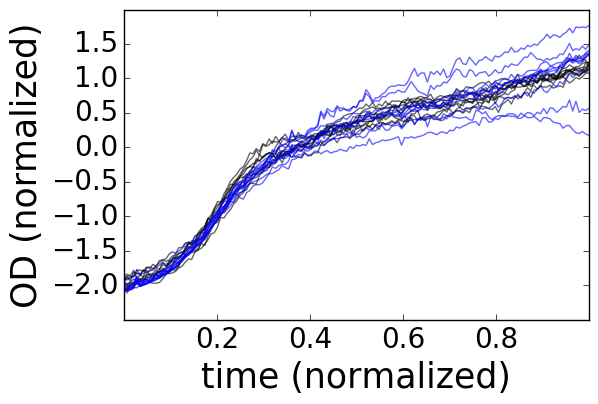

In [249]:
plt.figure(figsize=(6,4))
# plt.subplot(121)
# cov = m_noReplicate.y_k.K(m_withReplicate.x)
# ysample = np.dot(m_noReplicate.design_matrix,m_noReplicate.functionSamples(0).values[-1,:][None,:]) +\
#             scipy.stats.multivariate_normal.rvs(np.zeros(m_noReplicate.n),cov,size=m_noReplicate.m)

# fsample = m_noReplicate.functionMatrix()

# plt.plot(ysample.T,c='k',alpha=.4); 
# plt.plot(y,c='b',alpha=.4); 
# plt.plot(fsample,c='r',lw=3);

# plt.subplot(122)

for i in range(y.shape[1]):
    muSamp = m_randomEffect.functionMatrix()[:,0]
    
    cov = m_randomEffect.kernels[1].K(x)
    repSamp = scipy.stats.multivariate_normal.rvs(np.zeros(m_randomEffect.n),cov)
    
    cov = m_randomEffect.y_k.K(x)
    ySamp = muSamp + scipy.stats.multivariate_normal.rvs(repSamp,cov)
    
    plt.plot(x[:,0],ySamp,c='k',alpha=.6)

# cov = m_randomEffect.kernels[1].K(x) + m_randomEffect.y_k.K(x)
# ysample = np.dot(m_randomEffect.design_matrix[:,0][:,None],m_randomEffect.functionSamples(0).values[-1,:][None,:]) +\
#             scipy.stats.multivariate_normal.rvs(np.zeros(m_randomEffect.n),cov,size=m_randomEffect.m)

# fsample = m_noReplicate.functionMatrix()


plt.plot(x[:,0],y,c='b',alpha=.6); 
# plt.plot(ysample.T,c='k',alpha=.7); 
# plt.plot(fsample,c='r',lw=3);

plt.xlabel("time (normalized)",fontsize=25)
plt.ylabel("OD (normalized)",fontsize=25)
plt.xticks(np.arange(.2,1,.2),fontsize=20)
plt.yticks(np.arange(-2,2,.5),fontsize=20)

# plt.savefig("figures/ura3-pq-replicate/model-randomEffects-generative-singleReplicate.pdf",bbox_inches='tight')

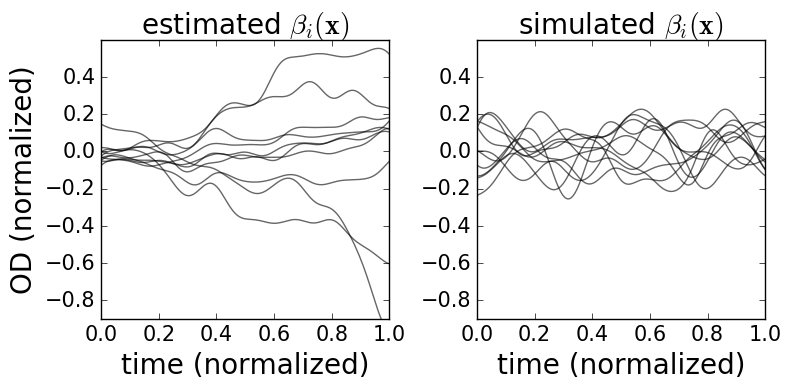

In [250]:
cov = m_randomEffect.kernels[1].K(x)

plt.figure(figsize=(8,4))

plt.subplot(121)
plt.plot(x,m_randomEffect.functionMatrix()[:,1:],c='k',alpha=.6)

plt.xlabel("time (normalized)",fontsize=20)
plt.ylabel("OD (normalized)",fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(-.9,.6)

plt.title("estimated $\\beta_i(\mathbf{x})$",fontsize=20)

plt.subplot(122)
for r in range(y.shape[1]):
    repSamp = scipy.stats.multivariate_normal.rvs(np.zeros(m_randomEffect.n),cov)
    plt.plot(x,repSamp,c='k',alpha=.6)
    
plt.ylim(-.9,.6)
plt.title("simulated $\\beta_i(\mathbf{x})$",fontsize=20)

plt.xlabel("time (normalized)",fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.tight_layout()

# plt.savefig("figures/ura3-pq-replicate/model-randomEffects-replicateSample-singleReplicate.pdf",bbox_inches='tight')

In [251]:
m_randomEffect.paa

AttributeError: 'Base' object has no attribute 'paa'

NameError: name 'm_withReplicate' is not defined

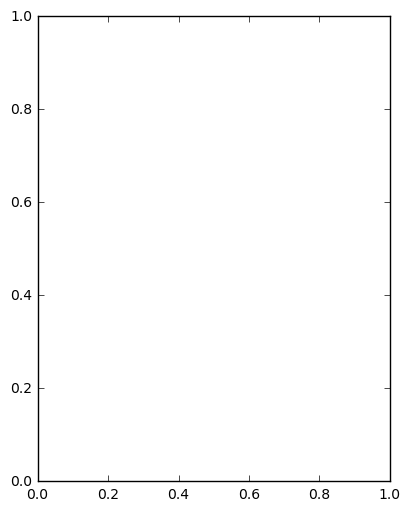

In [252]:
plt.figure(figsize=(10,6))
plt.subplot(121)
cov = m_noReplicate.y_k.K(m_withReplicate.x)
ysample = np.dot(m_noReplicate.design_matrix,m_noReplicate.functionSamples(0).values[-1,:][None,:]) +\
            scipy.stats.multivariate_normal.rvs(np.zeros(m_noReplicate.n),cov,size=m_noReplicate.m)

fsample = m_noReplicate.functionMatrix()

plt.plot(ysample.T,c='k',alpha=.4); 
plt.plot(y,c='b',alpha=.4); 
plt.plot(fsample,c='r',lw=3);

plt.subplot(122)
cov = m_randomEffect.kernels[1].K(x) + m_randomEffect.y_k.K(x)
ysample = np.dot(m_randomEffect.design_matrix[:,0][:,None],m_randomEffect.functionSamples(0).values[-1,:][None,:]) +\
            scipy.stats.multivariate_normal.rvs(np.zeros(m_randomEffect.n),cov,size=m_randomEffect.m)

# fsample = m_noReplicate.functionMatrix()


plt.plot(y,c='b',alpha=.4); 
plt.plot(ysample.T,c='k',alpha=.7); 
# plt.plot(fsample,c='r',lw=3);

# plt.savefig("figures/ura3-pq-replicate/model-noReplicate-generative.pdf",bbox_inches='tight')

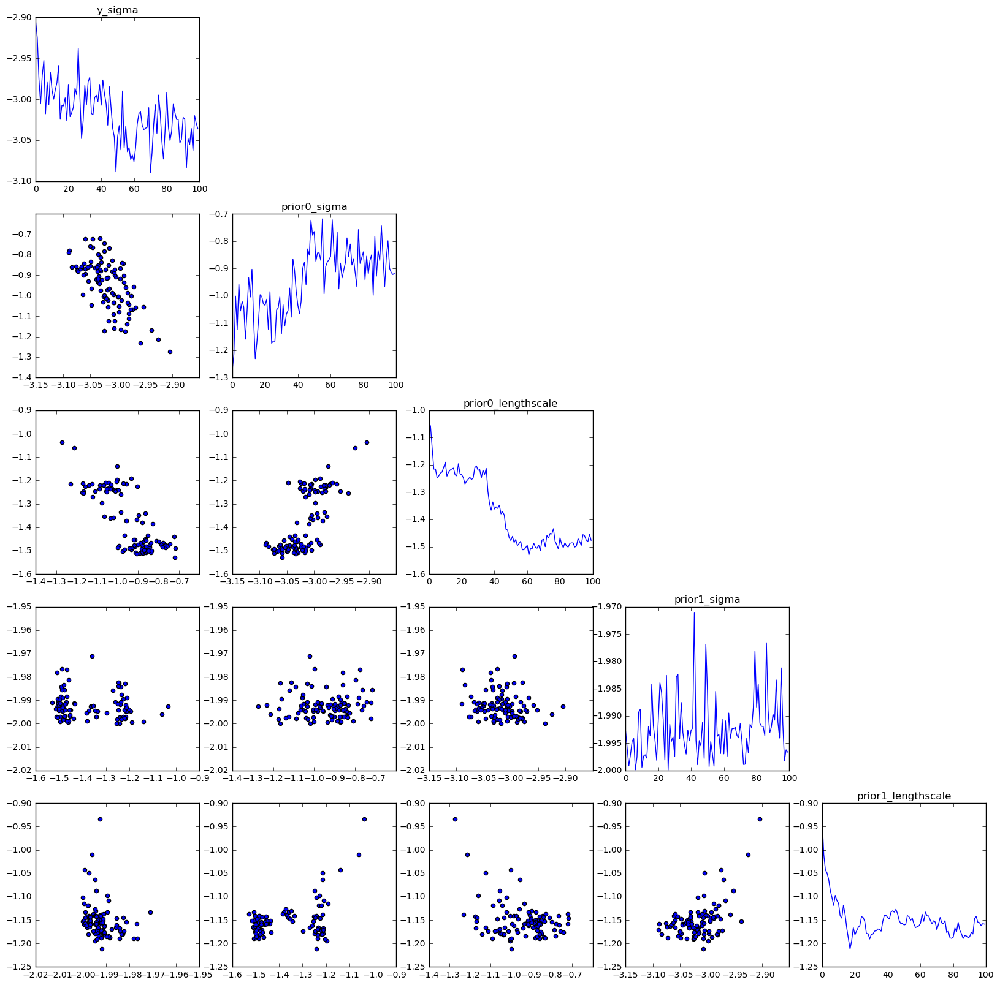

In [253]:
params = ['y_sigma','prior0_sigma','prior0_lengthscale','prior1_sigma','prior1_lengthscale']

plt.figure(figsize=(len(params)*4,len(params)*4))
for i,p in enumerate(params):
    plt.subplot(len(params),len(params),i+1+i*len(params))
    plt.title(p)
    plt.plot(m_randomEffect.parameter_history[p])
    
    for j,p2 in enumerate(params[:i]):
        plt.subplot(len(params),len(params),i+1+i*len(params)-j-1)
        plt.scatter(m_randomEffect.parameter_history[p2],m_randomEffect.parameter_history[p])

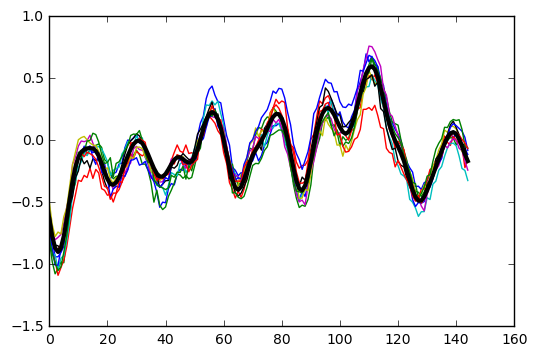

In [254]:
ysample, fsample = m_randomEffect.samplePrior()

plt.plot(ysample);
plt.plot(fsample[:,0],c='k',lw=3)

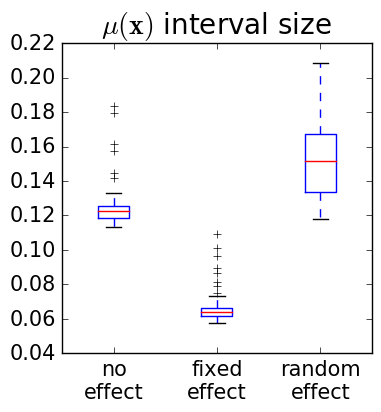

In [313]:
plt.figure(figsize=(4,4))

fsamp = [m_noReplicate.functionSamples(0).values,
         m_replicateEffect.functionSamples(0).values,
         m_randomEffect.functionSamples(0).values]

ints = [gpfanova.interval.FunctionInterval(fs,.95) for fs in fsamp]
deltas = [(i.ub-i.lb) for i in ints]

plt.boxplot(deltas,labels=['no\neffect','fixed\neffect','random\neffect'])
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title("$\mu(\mathbf{x})$ interval size",fontsize=20,y=1.01)

# plt.savefig("figures/ura3-pq-replicate/model-comparison-mu-singleReplicate.pdf",bbox_inches='tight')

(-2.1, -1.2)

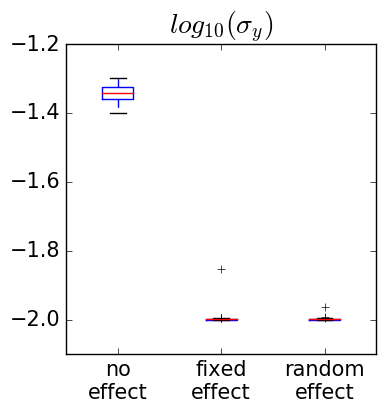

In [239]:
plt.figure(figsize=(4,4))

# fsamp = [m_noReplicate.functionSamples(0).values,
#          m_replicateEffect.functionSamples(0).values,
#          m_randomEffect.functionSamples(0).values]

# ints = [gpfanova.interval.FunctionInterval(fs,.95) for fs in fsamp]
# deltas = [(i.ub-i.lb) for i in ints]

ysigma = [m_noReplicate.parameter_history.y_sigma.values,
         m_replicateEffect.parameter_history.y_sigma.values,
         m_randomEffect.parameter_history.y_sigma.values,]

plt.boxplot(ysigma,labels=['no\neffect','fixed\neffect','random\neffect'])
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title("$log_{10}(\sigma_y)$",fontsize=20,y=1.01)

plt.ylim(-2.1,-1.2)

# plt.savefig("figures/ura3-pq-replicate/model-comparison-ysigma-singleReplicate.pdf",bbox_inches='tight')

{'boxes': [<matplotlib.lines.Line2D at 0x7effebadad50>,
 'caps': [<matplotlib.lines.Line2D at 0x7effebac10d0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7effeb9c7950>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7effeb9c7410>,
 'whiskers': [<matplotlib.lines.Line2D at 0x7effebadae50>,
  <matplotlib.lines.Line2D at 0x7effebb29a90>]}

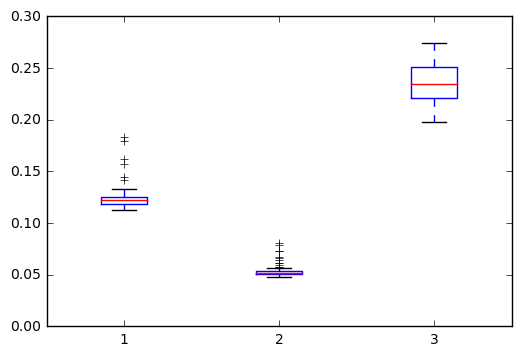

In [143]:
i = ints[0]

0.12374701880902801

# More data 

In [263]:
ds = gpfanova.dataset.DataSet('data/ura3-pq-replicate/')
x,y,effect,labels = ds.build(Strain='ura3',mM_PQ=0.0,scale='range',effects=['Bio','Tech'])

neffect = effect.Bio.unique().shape[0]
for e in range(neffect):
    select = effect.values[:,0] == e
    y[:,select] -= y[0,select].mean()
    
y = (y-y.mean())/y.std()

In [264]:
select = effect.Tech != 9
y = y[:,np.where(select)[0]]
effect = effect.loc[select,:]

In [265]:
for b in [6,8,10,12]:
    select = (effect != np.array([[b,0]])).values.any(1)
    
    y = y[:,np.where(select)[0]]
    effect = effect.loc[select,:]

In [82]:
y.shape

(145, 98)

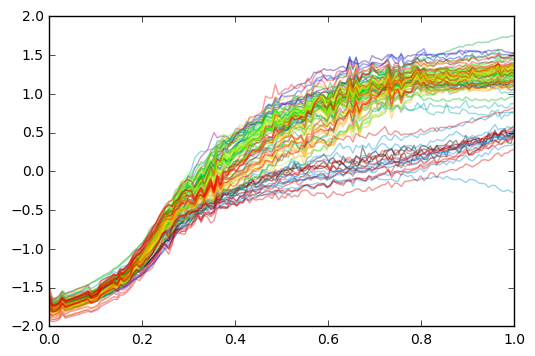

In [84]:
cmap = plt.get_cmap('spectral')
for i in range(y.shape[1]):
    plt.plot(x,y[:,i],c=cmap(1.*effect.values[i,0]/effect.Bio.unique().shape[0]),alpha=.4);

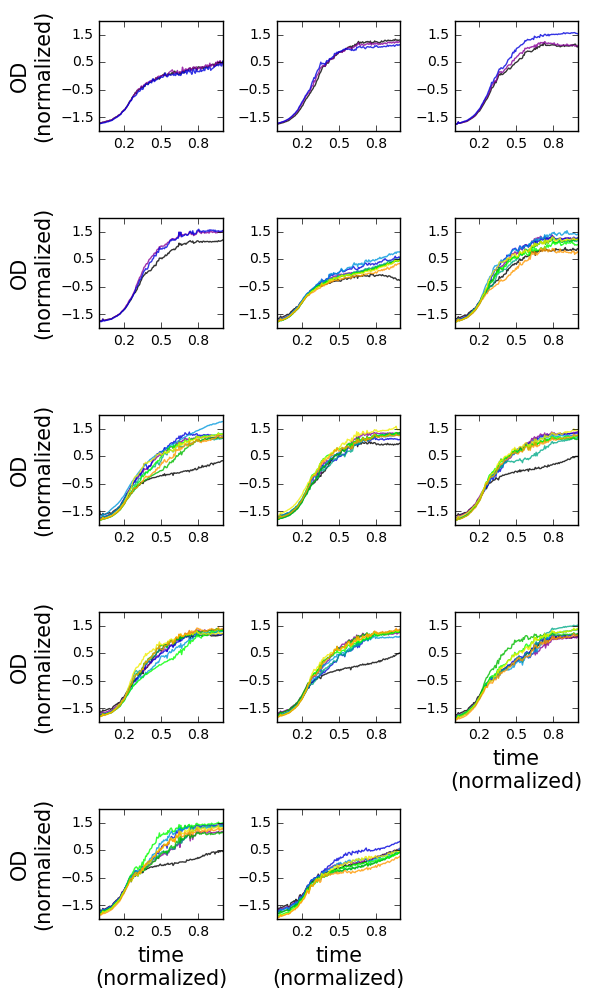

In [258]:
plt.figure(figsize=(6,10))

ncol = 3

for i in range(y.shape[1]):
    plt.subplot(neffect/ncol+1,ncol,effect.values[i,0]+1)
    #plt.plot(x,y[:,i],c=cmap(1.*effect.values[i,0]/neffect),alpha=.4);
    plt.plot(x,y[:,i],c=cmap(1.*effect.values[i,1]/10),alpha=.8,label=str(effect.values[i,1]));
    
    plt.ylim(-2,2)
    
for i in range(len(labels[0])):
    plt.subplot(neffect/ncol+1,ncol,i+1)
    #plt.title(labels[0][i])
    
    if i%ncol == 0:
        plt.yticks(np.arange(-1.5,2,1),fontsize=10)
        plt.ylabel("OD\n(normalized)",fontsize=15)
    else:
        plt.yticks(np.arange(-1.5,2,1),fontsize=10)
        
    if i >= 11:
        plt.xticks(np.arange(.2,1,.3),fontsize=10)
        plt.xlabel("time\n(normalized)",fontsize=15)
    else:
        plt.xticks(np.arange(.2,1,.3),fontsize=10)
    
plt.tight_layout()

plt.savefig("figures/ura3-pq-replicate/data-multipleReplicates.pdf",bbox_inches='tight',dpi=300)

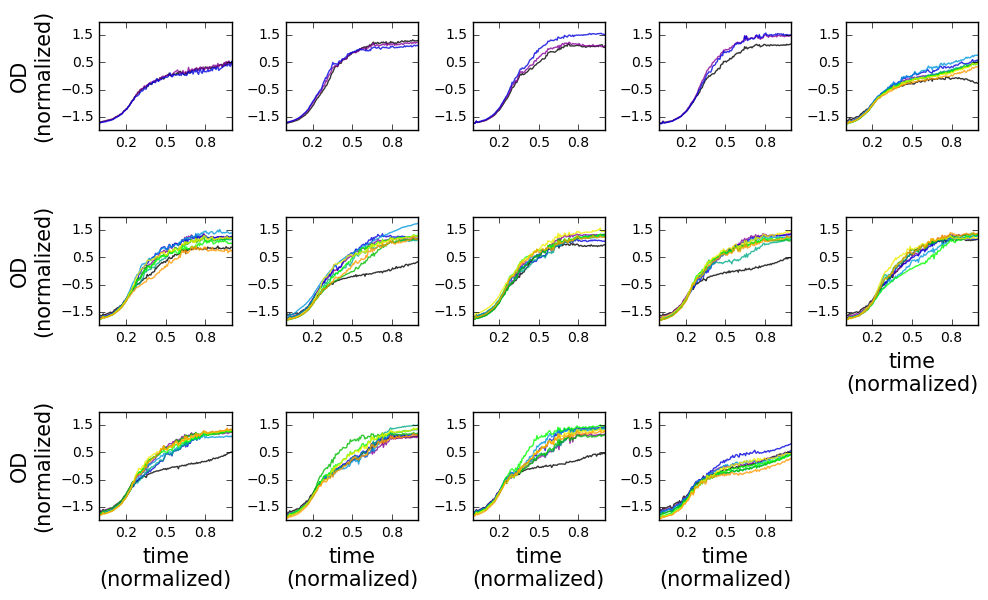

In [261]:
plt.figure(figsize=(10,6))

ncol = 5

for i in range(y.shape[1]):
    plt.subplot(neffect/ncol+1,ncol,effect.values[i,0]+1)
    #plt.plot(x,y[:,i],c=cmap(1.*effect.values[i,0]/neffect),alpha=.4);
    plt.plot(x,y[:,i],c=cmap(1.*effect.values[i,1]/10),alpha=.8,label=str(effect.values[i,1]));
    
    plt.ylim(-2,2)
    
for i in range(len(labels[0])):
    plt.subplot(neffect/ncol+1,ncol,i+1)
    #plt.title(labels[0][i])
    
    if i%ncol == 0:
        plt.yticks(np.arange(-1.5,2,1),fontsize=10)
        plt.ylabel("OD\n(normalized)",fontsize=15)
    else:
        plt.yticks(np.arange(-1.5,2,1),fontsize=10)
        
    if i >= 9:
        plt.xticks(np.arange(.2,1,.3),fontsize=10)
        plt.xlabel("time\n(normalized)",fontsize=15)
    else:
        plt.xticks(np.arange(.2,1,.3),fontsize=10)
    
plt.tight_layout()

plt.savefig("figures/ura3-pq-replicate/data-multipleReplicates-alt.pdf",bbox_inches='tight',dpi=300)

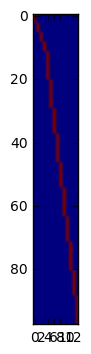

In [174]:
bioMatrix = np.zeros((y.shape[1],effect.Bio.unique().shape[0]))
for i,e in enumerate(effect.Bio):
#     print i,e
    bioMatrix[i,e] = 1
    
plt.imshow(bioMatrix)

In [175]:
dm_randomEffect = np.column_stack((np.ones(y.shape[1]),
                                   bioMatrix,
                                   np.eye(y.shape[1])))

In [409]:
m_randomEffect_bio = gpfanova.base.Base(x,y,designMatrix=dm_randomEffect,
                                        priorGroups=[[0],range(1,bioMatrix.shape[1]+1),range(bioMatrix.shape[1]+1,dm_randomEffect.shape[1])],
                                        bounds={'prior0_lengthscale':(-1,2),
                                                'prior1_lengthscale':(-1,2),
                                                'prior2_lengthscale':(-1,2),
                                                'prior1_sigma':(-4,-1),
                                                'prior2_sigma':(-4,-1),})

m_randomEffect_bio.parameter_cache.prior1_sigma = -2
m_randomEffect_bio.parameter_cache.prior2_sigma = -2

ERROR:gpfanova.base:design matrix is of rank 112, but there are 127 functions!


In [411]:
m_randomEffect_bio.sample(50,thin=10)

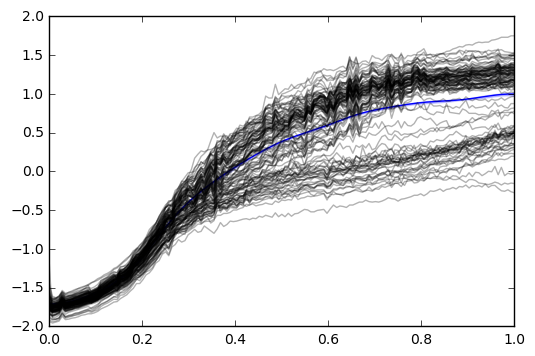

In [412]:
gpfanova.plot.plotFunctionSamples(m_randomEffect_bio.functionSamples(0).values,x=x[:,0])
plt.plot(x[:,0],y,c='k',alpha=.3);

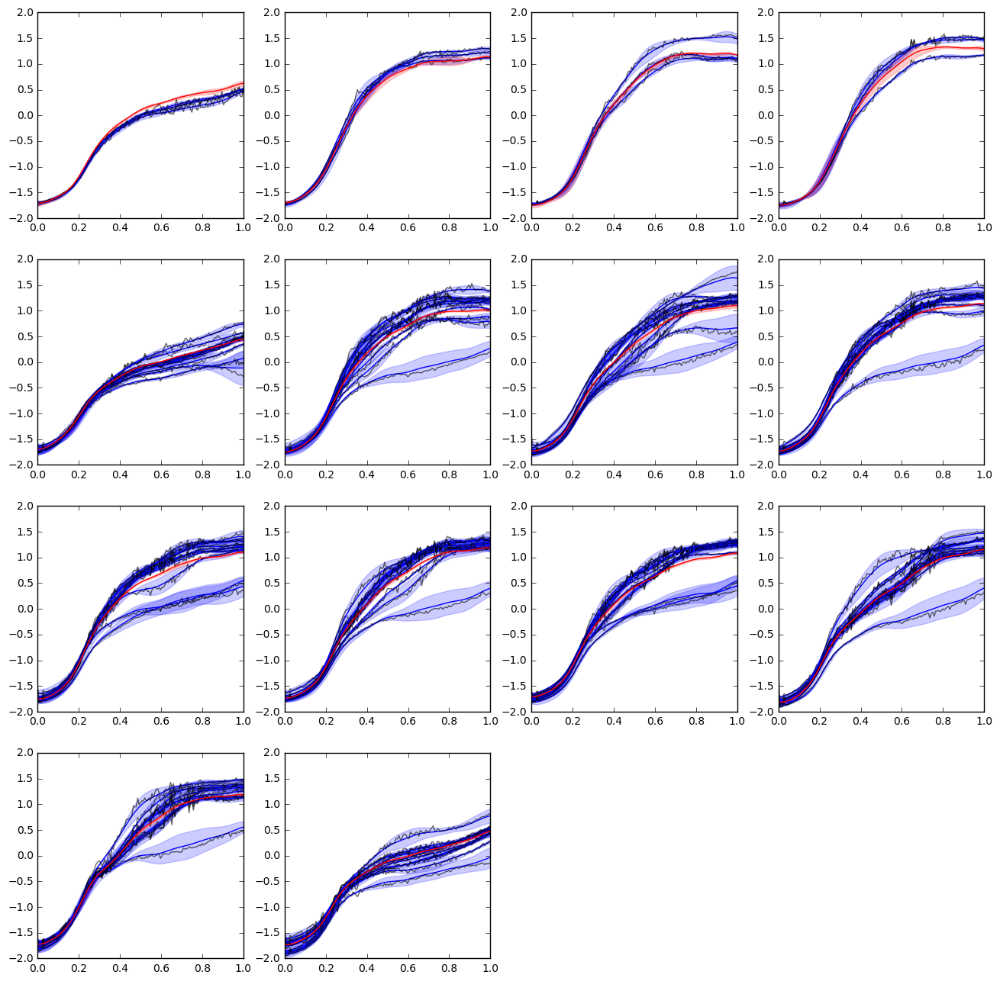

In [413]:
plt.figure(figsize=(16,16))


tensor = np.array([m_randomEffect_bio.functionSamples(i).values.T for i in range(m_randomEffect_bio.f)])

for r in range(y.shape[1]):
    plt.subplot(neffect/4+1,4,effect.values[r,0]+1)
    samp = np.dot(tensor.T,m_randomEffect_bio.design_matrix[r,:])
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0])
    
    plt.plot(x[:,0],y[:,r],c='k',alpha=.6);
    
for e in range(neffect):
    plt.subplot(neffect/4+1,4,e+1)
    samp = m_randomEffect_bio.functionSamples(0).values + m_randomEffect_bio.functionSamples(e+1).values
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0],c='r')
    
    plt.ylim(-2,2)

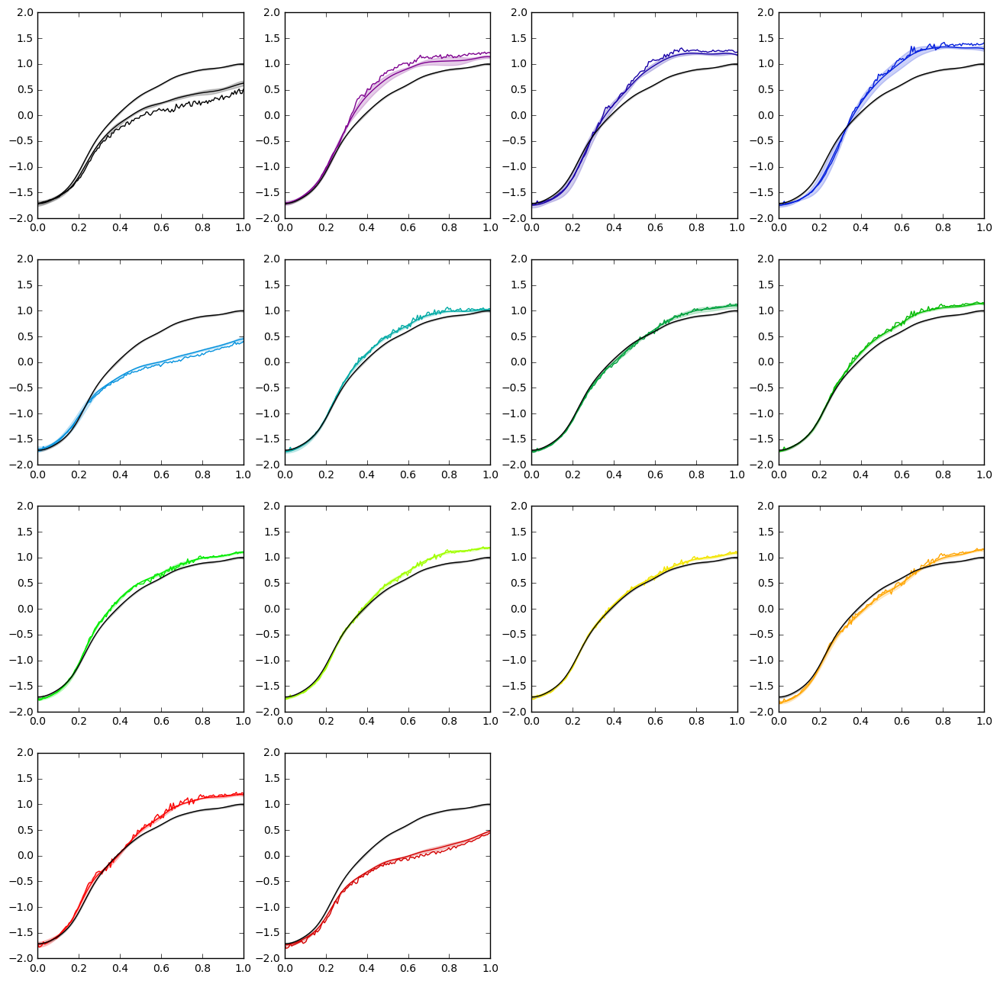

In [414]:
plt.figure(figsize=(16,16))

for e in range(neffect):
    plt.subplot(neffect/4+1,4,e+1)
    samp = m_randomEffect_bio.functionSamples(0).values + m_randomEffect_bio.functionSamples(e+1).values
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0],c=cmap(1.*e/neffect))
    plt.plot(x[:,0],y[:,effect.values[:,0]==e].mean(1),c=cmap(1.*e/neffect))
    
    gpfanova.plot.plotFunctionSamples(m_randomEffect_bio.functionSamples(0).values,x=x[:,0],c='k')
    
    plt.ylim(-2,2)

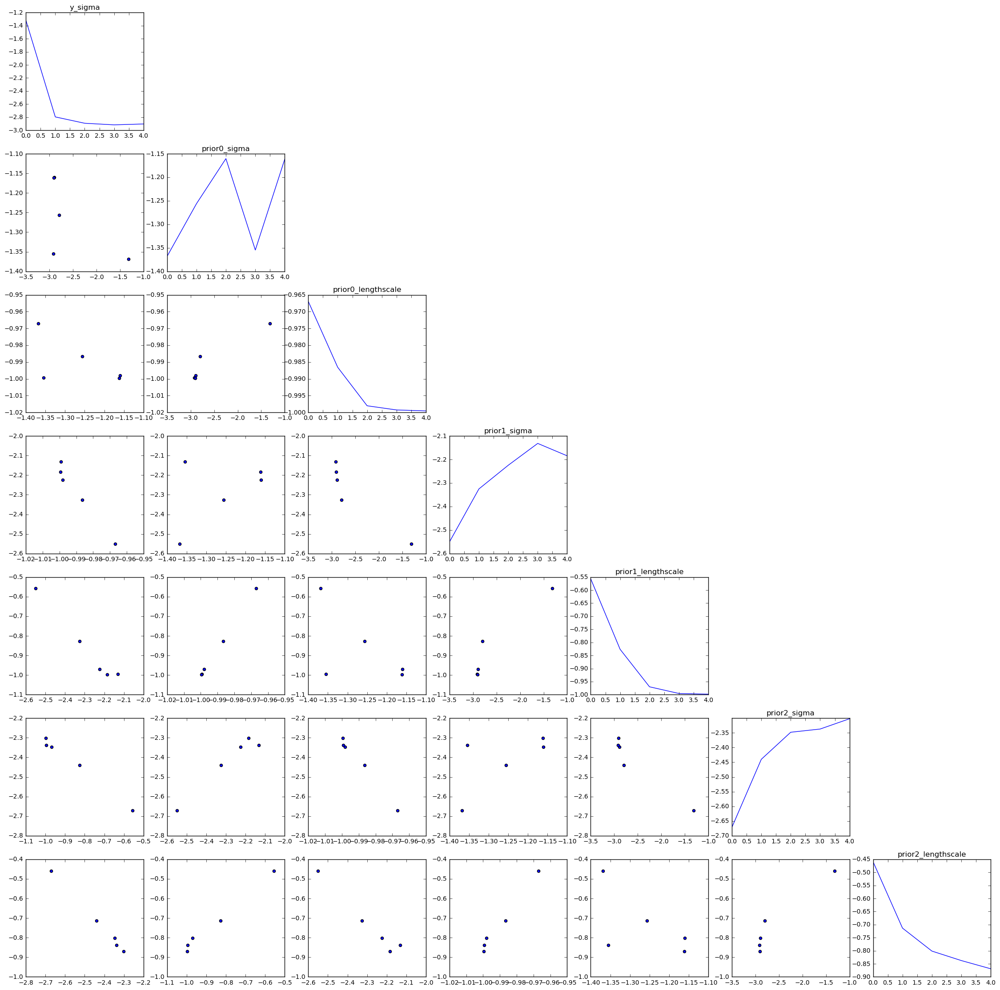

In [415]:
params = ['y_sigma','prior0_sigma','prior0_lengthscale','prior1_sigma','prior1_lengthscale','prior2_sigma','prior2_lengthscale']

plt.figure(figsize=(len(params)*4,len(params)*4))
for i,p in enumerate(params):
    plt.subplot(len(params),len(params),i+1+i*len(params))
    plt.title(p)
    plt.plot(m_randomEffect_bio.parameter_history[p])
    
    for j,p2 in enumerate(params[:i]):
        plt.subplot(len(params),len(params),i+1+i*len(params)-j-1)
        plt.scatter(m_randomEffect_bio.parameter_history[p2],m_randomEffect_bio.parameter_history[p])

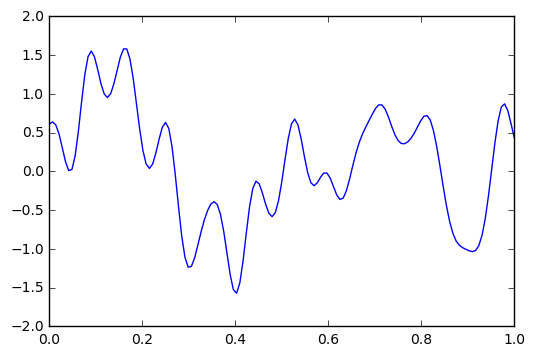

In [639]:
cov = m_randomEffect_bio.kernels[2].K(m_randomEffect.x,prior2_lengthscale=-1.5,prior2_sigma=0)

fsample = scipy.stats.multivariate_normal.rvs(np.zeros(m_randomEffect_bio.x.shape[0]),cov)

plt.plot(x[:,0],fsample)

In [538]:
m_randomEffect_bio.functionSamples(0).values.std(0).mean(),\
m_randomEffect.functionSamples(0).values.std(0).mean(),\
m_noReplicate.functionSamples(0).values.std(0).mean(),\
m_replicateEffect.functionSamples(0).values.std(0).mean()

(0.0048283119322066097,
 0.036129691679215904,
 0.019364231032352568,
 0.0035765078315592464)

## Integrate replicates 

In [516]:
reload(gpfanova.base)

<module 'gpfanova.base' from '/home/ptonner/dev/combinatorial-growth/local/lib/python2.7/site-packages/gpfanova/base.pyc'>

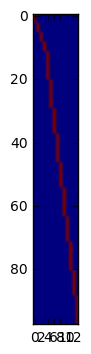

In [176]:
bioMatrix = np.zeros((y.shape[1],effect.Bio.unique().shape[0]))
for i,e in enumerate(effect.Bio):
#     print i,e
    bioMatrix[i,e] = 1
    
plt.imshow(bioMatrix)

In [177]:
dm_randomEffect_intRep = np.column_stack((np.ones(y.shape[1]),
                                   bioMatrix,))

m_randomEffect_bio_intRep = gpfanova.base.Base_withReplicate(x,y,designMatrix=dm_randomEffect_intRep,
                                        priorGroups=[[0],range(1,bioMatrix.shape[1]+1)],
                                        bounds={'y_sigma':(-4,-1),
                                                'prior0_lengthscale':(-1,2),
                                                'prior1_lengthscale':(-1,2),
                                                'prior0_sigma':(-4,-1),
                                                'prior1_sigma':(-4,-1),
                                                },
                                        replicateSigmaBounds=(-4,-1),
                                        replicateLengthscaleBounds=(-1,2))

# m_randomEffect_bio_intRep = gpfanova.base.Base(x,y,designMatrix=dm_randomEffect_intRep,
#                                         priorGroups=[[0],range(1,bioMatrix.shape[1]+1)],
#                                         bounds={'prior0_lengthscale':(-1,2),
#                                                 'prior1_lengthscale':(-1,2),
#                                                 'prior1_sigma':(-4,-1),
#                                                 'y_sigma':(-4,-1)},
#                                         replicateSigmaBounds=(-4,-1),
#                                         replicateLengthscaleBounds=(-1,2))

m_randomEffect_bio_intRep.parameter_cache.prior0_sigma

ERROR:gpfanova.base:design matrix is of rank 14, but there are 15 functions!


-2.5

In [183]:
m_randomEffect_bio_intRep.sample(500,thin=10)

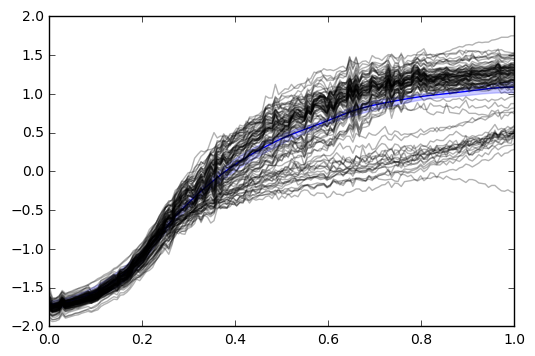

In [179]:
gpfanova.plot.plotFunctionSamples(m_randomEffect_bio_intRep.functionSamples(0).values,x=x[:,0])
plt.plot(x[:,0],y,c='k',alpha=.3);

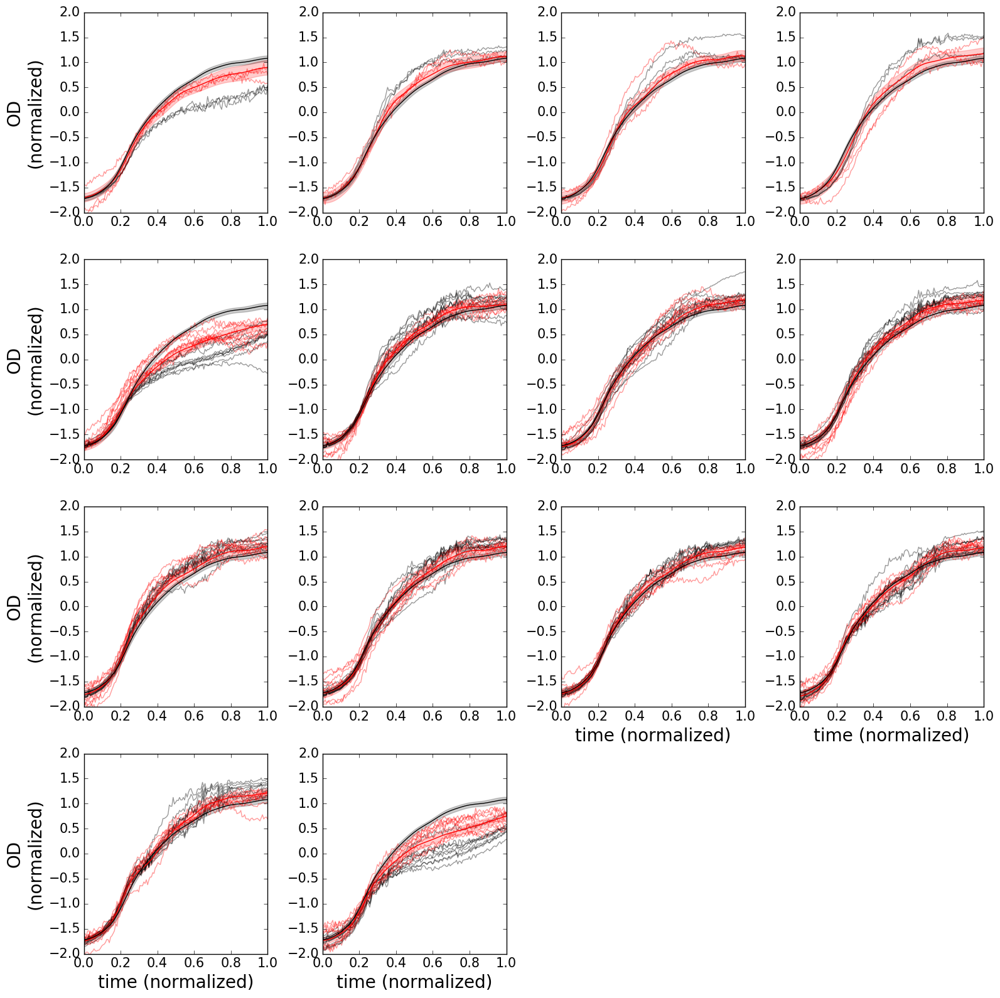

In [266]:
plt.figure(figsize=(16,16))

tensor = np.array([m_randomEffect_bio_intRep.functionSamples(i).values.T for i in range(m_randomEffect_bio_intRep.f)])

for r in range(y.shape[1]):
    plt.subplot(neffect/4+1,4,effect.values[r,0]+1)
    samp = np.dot(tensor.T,m_randomEffect_bio_intRep.design_matrix[r,:])
    
    #gpfanova.plot.plotFunctionSamples(samp,x=x[:,0])
    
    samp = np.dot(tensor.T,m_randomEffect_bio_intRep.design_matrix[r,:])
    samp = samp[-1,:]
    cov = m_randomEffect_bio_intRep.y_k.K(x)

    sample = scipy.stats.multivariate_normal.rvs(samp,cov)

    plt.plot(x[:,0],sample,c='r',alpha=.4)
    
    plt.plot(x[:,0],y[:,r],c='k',alpha=.4);
    
for e in range(neffect):
    plt.subplot(neffect/4+1,4,e+1)
    samp = m_randomEffect_bio_intRep.functionSamples(0).values + m_randomEffect_bio_intRep.functionSamples(e+1).values
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0],c='r')
    
    gpfanova.plot.plotFunctionSamples(m_randomEffect_bio_intRep.functionSamples(0).values,x=x[:,0],c='k')
    
    if e >= 10:
        plt.xlabel("time (normalized)",fontsize=20)
        
    if e%4 == 0:
        plt.ylabel("OD\n(normalized)",fontsize=20)
        
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    
    
    plt.ylim(-2,2)
    
plt.tight_layout()

plt.savefig("figures/ura3-pq-replicate/model-multipleReplicates-generative.pdf",bbox_inches='tight',dpi=300)

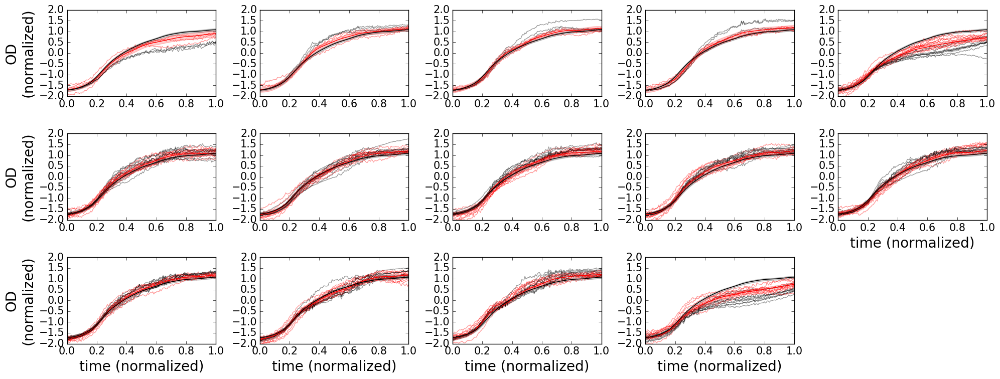

In [271]:
plt.figure(figsize=(20,12))

tensor = np.array([m_randomEffect_bio_intRep.functionSamples(i).values.T for i in range(m_randomEffect_bio_intRep.f)])

for r in range(y.shape[1]):
    plt.subplot(neffect/3+1,5,effect.values[r,0]+1)
    samp = np.dot(tensor.T,m_randomEffect_bio_intRep.design_matrix[r,:])
    
    #gpfanova.plot.plotFunctionSamples(samp,x=x[:,0])
    
    samp = np.dot(tensor.T,m_randomEffect_bio_intRep.design_matrix[r,:])
    samp = samp[-1,:]
    cov = m_randomEffect_bio_intRep.y_k.K(x)

    sample = scipy.stats.multivariate_normal.rvs(samp,cov)

    plt.plot(x[:,0],sample,c='r',alpha=.4)
    
    plt.plot(x[:,0],y[:,r],c='k',alpha=.4);
    
for e in range(neffect):
    plt.subplot(neffect/3+1,5,e+1)
    samp = m_randomEffect_bio_intRep.functionSamples(0).values + m_randomEffect_bio_intRep.functionSamples(e+1).values
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0],c='r')
    
    gpfanova.plot.plotFunctionSamples(m_randomEffect_bio_intRep.functionSamples(0).values,x=x[:,0],c='k')
    
    if e >= 9:
        plt.xlabel("time (normalized)",fontsize=20)
        
    if e%5 == 0:
        plt.ylabel("OD\n(normalized)",fontsize=20)
        
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    
    
    plt.ylim(-2,2)
    
plt.tight_layout()

plt.savefig("figures/ura3-pq-replicate/model-multipleReplicates-generative-alt.pdf",bbox_inches='tight',dpi=300)

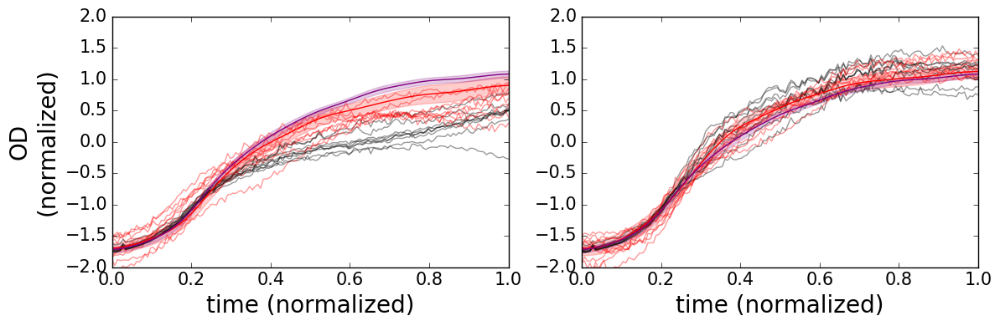

In [208]:
plt.figure(figsize=(12,4))

tensor = np.array([m_randomEffect_bio_intRep.functionSamples(i).values.T for i in range(m_randomEffect_bio_intRep.f)])

effectSelect = [4,5]

for r in range(y.shape[1]):
    if not effect.values[r,0] in effectSelect:
        continue
    
    plt.subplot(1,2,effectSelect.index(effect.values[r,0])+1)
    samp = np.dot(tensor.T,m_randomEffect_bio_intRep.design_matrix[r,:])
    
    #gpfanova.plot.plotFunctionSamples(samp,x=x[:,0])
    
    samp = np.dot(tensor.T,m_randomEffect_bio_intRep.design_matrix[r,:])
    samp = samp[-1,:]
    cov = m_randomEffect_bio_intRep.y_k.K(x)

    sample = scipy.stats.multivariate_normal.rvs(samp,cov)

    plt.plot(x[:,0],sample,c='r',alpha=.4)
    
    plt.plot(x[:,0],y[:,r],c='k',alpha=.4);
    
for e in range(len(effectSelect)):
    plt.subplot(1,2,e+1)
    samp = m_randomEffect_bio_intRep.functionSamples(0).values + m_randomEffect_bio_intRep.functionSamples(e+1).values
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0],c='r')
    
    gpfanova.plot.plotFunctionSamples(m_randomEffect_bio_intRep.functionSamples(0).values,x=x[:,0],c='purple')
    
    plt.xlabel("time (normalized)",fontsize=20)
        
    if e%4 == 0:
        plt.ylabel("OD\n(normalized)",fontsize=20)
        
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    
    
    plt.ylim(-2,2)
    
plt.tight_layout()

plt.savefig("figures/ura3-pq-replicate/model-multipleReplicates-generative-select.pdf",bbox_inches='tight',dpi=300)

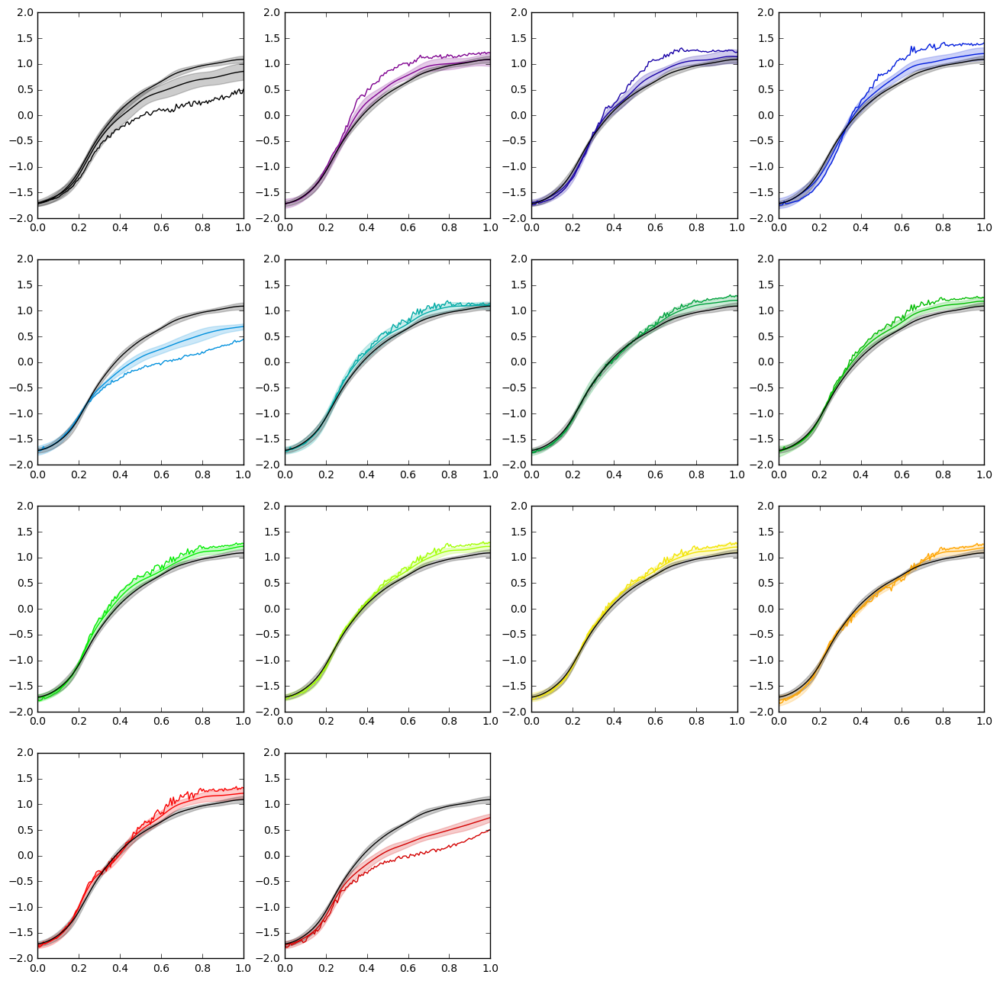

In [181]:
plt.figure(figsize=(16,16))

for e in range(neffect):
    plt.subplot(neffect/4+1,4,e+1)
    samp = m_randomEffect_bio_intRep.functionSamples(0).values + m_randomEffect_bio_intRep.functionSamples(e+1).values
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0],c=cmap(1.*e/neffect))
    plt.plot(x[:,0],y[:,effect.values[:,0]==e].mean(1),c=cmap(1.*e/neffect))
    
    gpfanova.plot.plotFunctionSamples(m_randomEffect_bio_intRep.functionSamples(0).values,x=x[:,0],c='k')
    
    plt.ylim(-2,2)

(-2, 1.5)

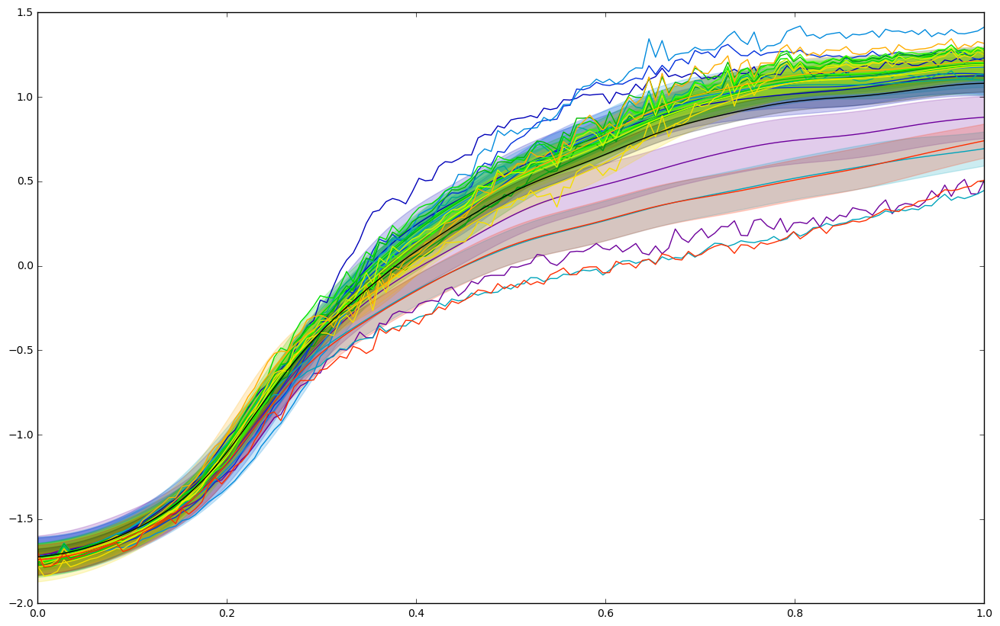

In [678]:
plt.figure(figsize=(16,10))

buff = 2
for e in range(neffect):
    samp = m_randomEffect_bio_intRep.functionSamples(0).values + m_randomEffect_bio_intRep.functionSamples(e+1).values
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0],c=cmap(1.*(e+buff)/(neffect+2*buff)))
    plt.plot(x[:,0],y[:,effect.values[:,0]==e].mean(1),c=cmap(1.*(e+buff)/(neffect+2*buff)))
    
gpfanova.plot.plotFunctionSamples(m_randomEffect_bio_intRep.functionSamples(0).values,x=x[:,0],c='k')
    
plt.ylim(-2,1.5)

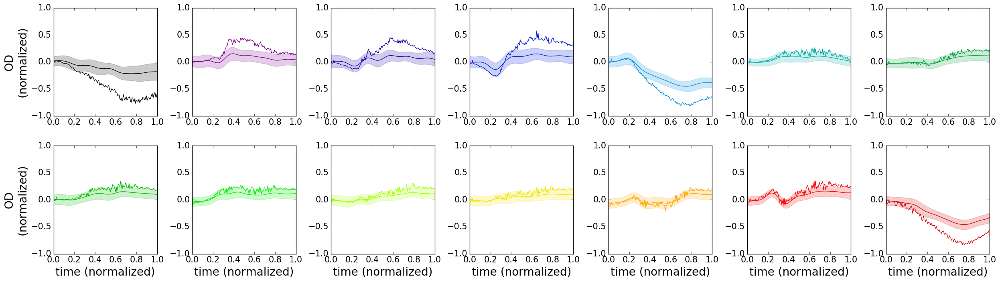

In [194]:
plt.figure(figsize=(25,10))

for e in range(neffect):
    plt.subplot(neffect/7+1,7,e+1)
    samp = m_randomEffect_bio_intRep.functionSamples(e+1).values
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0],c=cmap(1.*e/neffect))
    plt.plot(x[:,0],y[:,effect.values[:,0]==e].mean(1)-m_randomEffect_bio_intRep.functionSamples(0).values.mean(0),c=cmap(1.*e/neffect))
    
    if e >= 7:
        plt.xlabel("time (normalized)",fontsize=20)
        
    if e%7 == 0:
        plt.ylabel("OD\n(normalized)",fontsize=20)
        
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    
    plt.ylim(-1,1)
    
plt.tight_layout()
plt.savefig("figures/ura3-pq-replicate/model-multipleReplicates-bio.pdf",bbox_inches='tight',dpi=300)

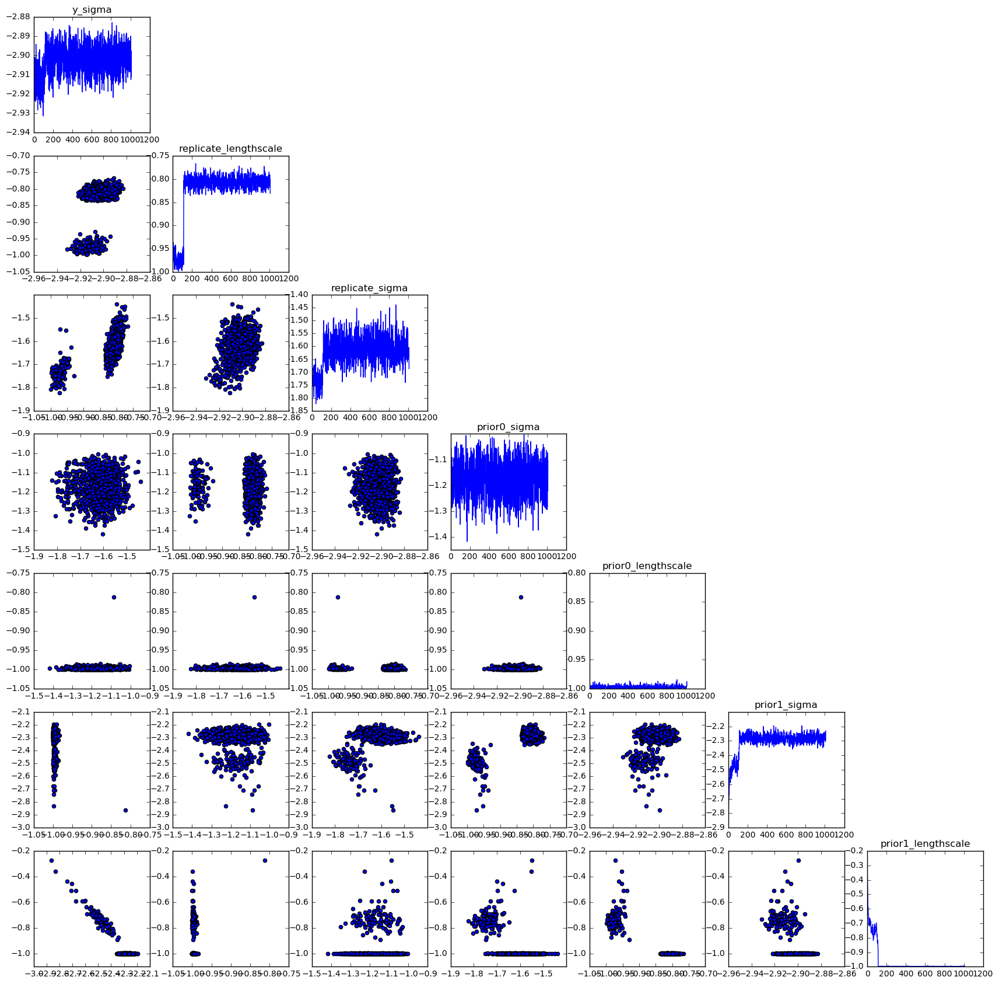

In [680]:
params = ['y_sigma','replicate_lengthscale','replicate_sigma','prior0_sigma','prior0_lengthscale','prior1_sigma','prior1_lengthscale']

plt.figure(figsize=(len(params)*3,len(params)*3))
for i,p in enumerate(params):
    plt.subplot(len(params),len(params),i+1+i*len(params))
    plt.title(p)
    plt.plot(m_randomEffect_bio_intRep.parameter_history[p])
    
    for j,p2 in enumerate(params[:i]):
        plt.subplot(len(params),len(params),i+1+i*len(params)-j-1)
        plt.scatter(m_randomEffect_bio_intRep.parameter_history[p2],m_randomEffect_bio_intRep.parameter_history[p])

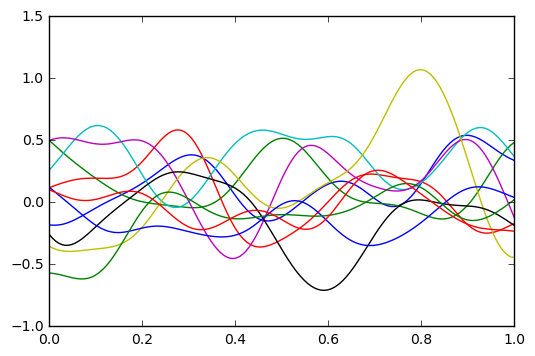

In [687]:
cov = m_randomEffect_bio_intRep.kernels[1].K(m_randomEffect.x,prior1_sigma=-1)

fsample = scipy.stats.multivariate_normal.rvs(np.zeros(x.shape[0]),cov,size=10)

plt.plot(x[:,0],fsample.T);

## Seperate prior for each BIO 

In [690]:
bounds = {'prior%d_sigma'%i:(-4,-1) for i in range(dm_randomEffect_intRep.shape[1])}
bounds.update({'prior%d_lengthscale'%i:(-1,2) for i in range(dm_randomEffect_intRep.shape[1])})
bounds['y_sigma'] = (-4,-1)

bounds

{'prior0_lengthscale': (-1, 2),
 'prior0_sigma': (-4, -1),
 'prior10_lengthscale': (-1, 2),
 'prior10_sigma': (-4, -1),
 'prior11_lengthscale': (-1, 2),
 'prior11_sigma': (-4, -1),
 'prior12_lengthscale': (-1, 2),
 'prior12_sigma': (-4, -1),
 'prior13_lengthscale': (-1, 2),
 'prior13_sigma': (-4, -1),
 'prior14_lengthscale': (-1, 2),
 'prior14_sigma': (-4, -1),
 'prior1_lengthscale': (-1, 2),
 'prior1_sigma': (-4, -1),
 'prior2_lengthscale': (-1, 2),
 'prior2_sigma': (-4, -1),
 'prior3_lengthscale': (-1, 2),
 'prior3_sigma': (-4, -1),
 'prior4_lengthscale': (-1, 2),
 'prior4_sigma': (-4, -1),
 'prior5_lengthscale': (-1, 2),
 'prior5_sigma': (-4, -1),
 'prior6_lengthscale': (-1, 2),
 'prior6_sigma': (-4, -1),
 'prior7_lengthscale': (-1, 2),
 'prior7_sigma': (-4, -1),
 'prior8_lengthscale': (-1, 2),
 'prior8_sigma': (-4, -1),
 'prior9_lengthscale': (-1, 2),
 'prior9_sigma': (-4, -1),
 'y_sigma': (-4, -1)}

In [691]:
# dm_randomEffect_intRep = np.column_stack((np.ones(y.shape[1]),
#                                    bioMatrix,))

m_randomEffect_bio_intRep_seperate = gpfanova.base.Base_withReplicate(x,y,designMatrix=dm_randomEffect_intRep,
                                        priorGroups=[[i] for i in range(dm_randomEffect_intRep.shape[1])],
                                        bounds=bounds,
                                        replicateSigmaBounds=(-4,-1),
                                        replicateLengthscaleBounds=(-1,2))

ERROR:gpfanova.base:design matrix is of rank 14, but there are 15 functions!


(-4, -1)


In [ ]:
m_randomEffect_bio_intRep_seperate.sample(300,thin=10)

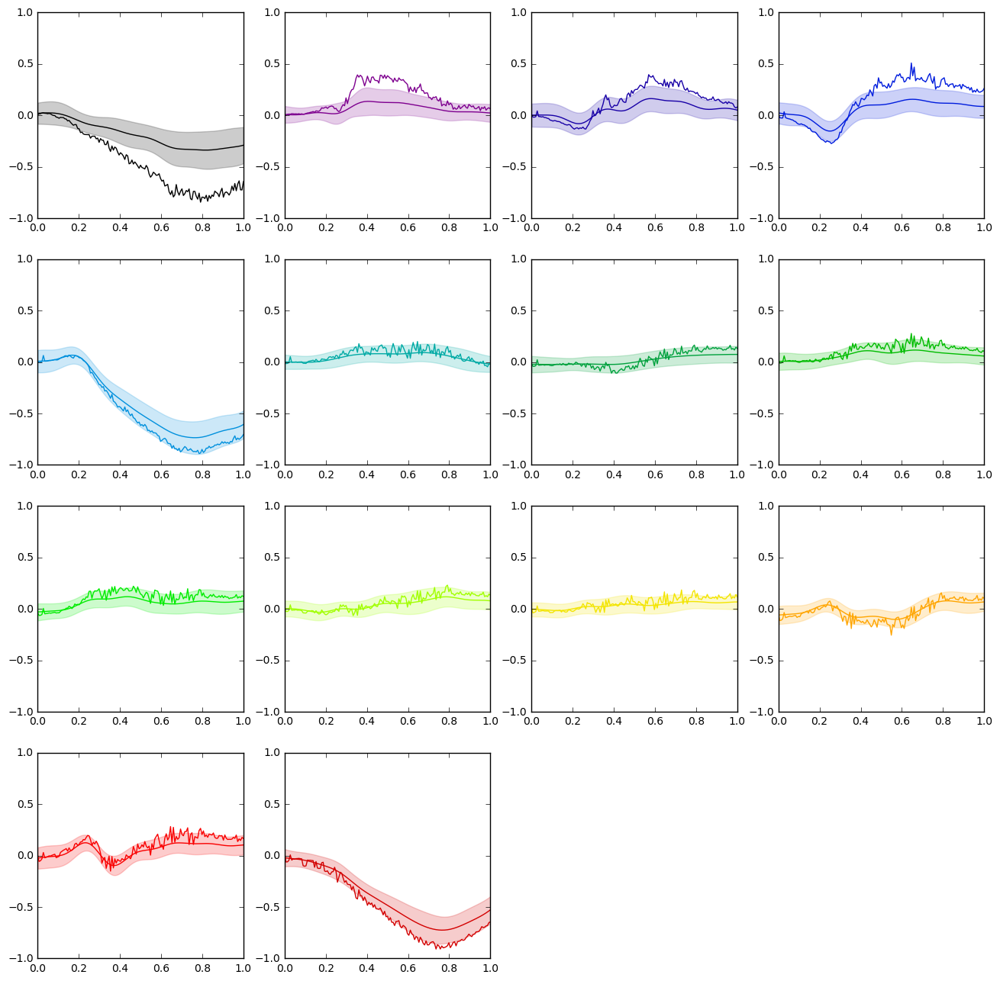

In [695]:
plt.figure(figsize=(16,16))

for e in range(neffect):
    plt.subplot(neffect/4+1,4,e+1)
    samp = m_randomEffect_bio_intRep_seperate.functionSamples(e+1).values
    gpfanova.plot.plotFunctionSamples(samp,x=x[:,0],c=cmap(1.*e/neffect))
    plt.plot(x[:,0],y[:,effect.values[:,0]==e].mean(1)-m_randomEffect_bio_intRep_seperate.functionSamples(0).values.mean(0),c=cmap(1.*e/neffect))
    
    plt.ylim(-1,1)

In [697]:
params = bounds.keys()
params.sort()

plt.figure(figsize=(len(params)*3,len(params)*3))
for i,p in enumerate(params):
    plt.subplot(len(params),len(params),i+1+i*len(params))
    plt.title(p)
    plt.plot(m_randomEffect_bio_intRep_seperate.parameter_history[p])
    
    for j,p2 in enumerate(params[:i]):
        plt.subplot(len(params),len(params),i+1+i*len(params)-j-1)
        plt.scatter(m_randomEffect_bio_intRep_seperate.parameter_history[p2],m_randomEffect_bio_intRep_seperate.parameter_history[p])

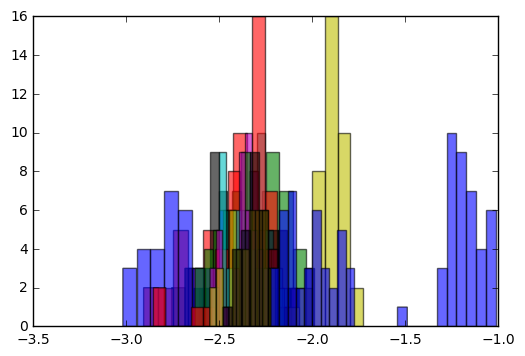

In [699]:
for i in range(dm_randomEffect_intRep.shape[1]):
    plt.hist(m_randomEffect_bio_intRep_seperate.parameter_history['prior%d_sigma'%i],alpha=.6)

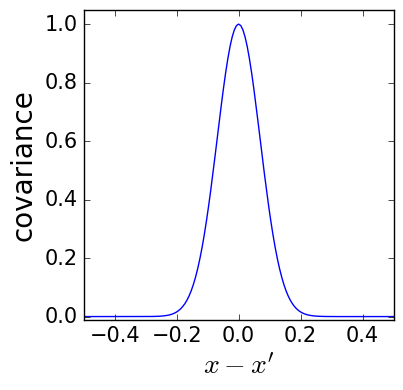

In [368]:
plt.figure(figsize=(4,4))

k = m_randomEffect.kernels[1].K(x)
plt.plot(x-x[x.shape[0]/2,0],k[x.shape[0]/2,:]/k.max())

plt.ylabel("covariance",fontsize=20)
plt.xlabel("$x-x'$",fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.ylim(-.01,1.05)
plt.xlim(-.5,.5)

plt.savefig("figures/ura3-pq-replicate/example-kernel.png",bbox_inches='tight',dpi=300)

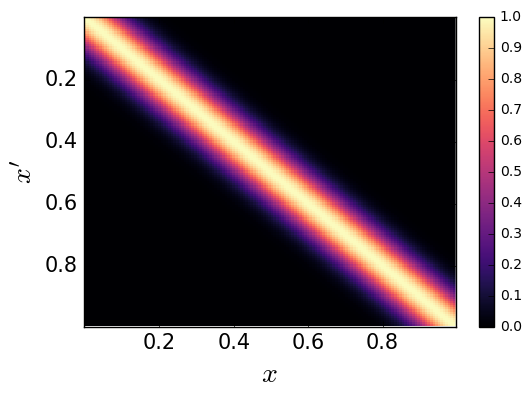

In [374]:
plt.figure(figsize=(6,4))

k = m_randomEffect.kernels[1].K(x)
plt.imshow(k/k.max(),cmap='magma',interpolation='none',aspect='auto')

# plt.ylabel("covariance",fontsize=20)
plt.xlabel("$x$",fontsize=20)
plt.ylabel("$x'$",fontsize=20)
plt.xticks(np.arange(x.shape[0]/5,x.shape[0],x.shape[0]/5),[z.round(1)[0] for z in x[x.shape[0]/5::x.shape[0]/5]],fontsize=15)
plt.yticks(np.arange(x.shape[0]/5,x.shape[0],x.shape[0]/5),[z.round(1)[0] for z in x[x.shape[0]/5::x.shape[0]/5]],fontsize=15)
# plt.yticks([])

# plt.ylim(-.01,1.05)
# plt.xlim(-.5,.5)

plt.colorbar()

plt.savefig("figures/ura3-pq-replicate/example-kernel-full.png",bbox_inches='tight',dpi=300)

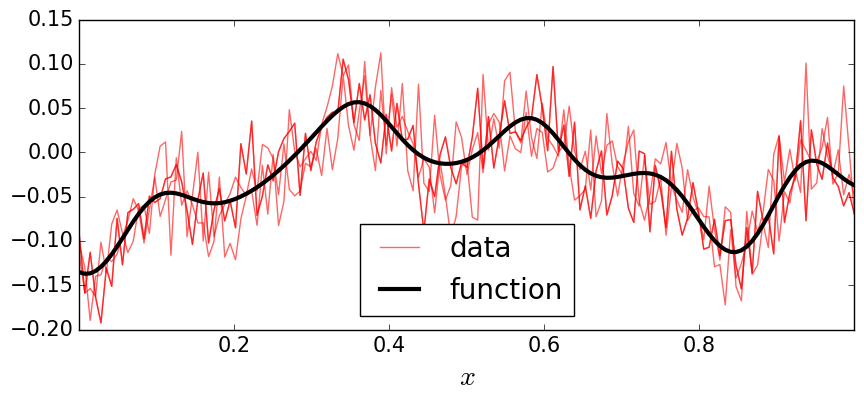

In [381]:
fsample = scipy.stats.multivariate_normal.rvs(np.zeros(x.shape[0]),k)
ysample = scipy.stats.multivariate_normal.rvs(fsample,m_randomEffect.y_k.K(x)*1.3,size=3)

plt.figure(figsize=(10,4))

plt.plot(x[:,0],ysample[0,:].T,'r',alpha=.6,label='data')
plt.plot(x[:,0],ysample.T,'r',alpha=.6)
plt.plot(x[:,0],fsample,'k',lw=3,label='function')

plt.xlabel("$x$",fontsize=20)
plt.xticks(np.arange(.2,1,.2),fontsize=15)
plt.yticks(fontsize=15)

plt.legend(loc='best',fontsize=20)

plt.savefig("figures/ura3-pq-replicate/example-data.png",bbox_inches='tight',dpi=300)

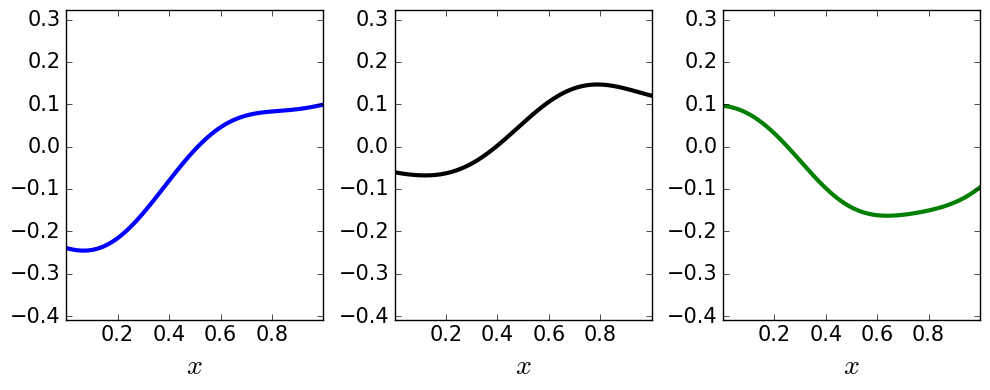

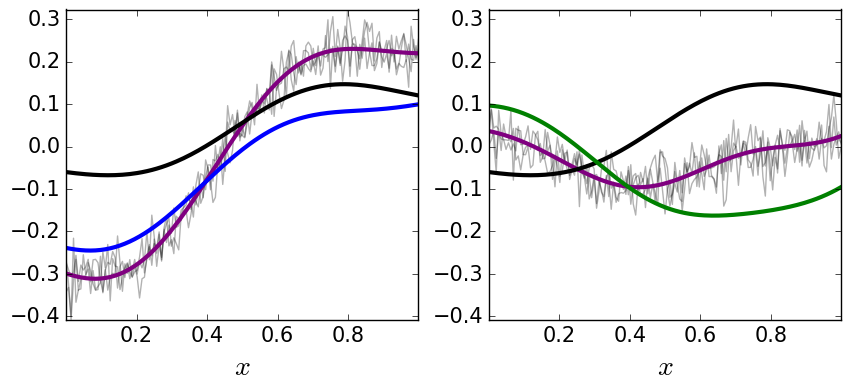

In [429]:
k = m_randomEffect.kernels[1].K(x,prior1_lengthscale=-.5)

fsample = scipy.stats.multivariate_normal.rvs(np.zeros(x.shape[0]),k,size=3)

dm = np.zeros((6,3))
dm[:,0] = 1
dm[:3,1] = 1
dm[3:,2] = 1

mu = np.dot(dm,fsample)
ysample = np.array([scipy.stats.multivariate_normal.rvs(mu[i,:],m_randomEffect.y_k.K(x)*1.3) for i in range(mu.shape[0])]).T

plt.figure(figsize=(10,4))

# plt.plot(x[:,0],fsample.T,'k',lw=3,label='function')

plt.subplot(132)
plt.plot(x[:,0],fsample[0,:],'k',lw=3,label='function')

plt.xlabel("$x$",fontsize=20)
plt.xticks(np.arange(.2,1,.2),fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(ysample.min(),ysample.max())

plt.subplot(131)
plt.plot(x[:,0],fsample[1,:],'b',lw=3,label='function')

plt.xlabel("$x$",fontsize=20)
plt.xticks(np.arange(.2,1,.2),fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(ysample.min(),ysample.max())

plt.subplot(133)
plt.plot(x[:,0],fsample[2,:],'g',lw=3,label='function')

plt.xlabel("$x$",fontsize=20)
plt.xticks(np.arange(.2,1,.2),fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(ysample.min(),ysample.max())

plt.tight_layout()

plt.savefig("figures/ura3-pq-replicate/example-multiple-functions.png",bbox_inches='tight',dpi=300)

plt.figure(figsize=(10,4))

plt.subplot(121)

plt.plot(x[:,0],ysample[:,:3],'k',alpha=.3)
plt.plot(x[:,0],fsample[:2,:].sum(0),'purple',alpha=1,lw=3)
plt.plot(x[:,0],fsample[0,:],'k',alpha=1,lw=3)
plt.plot(x[:,0],fsample[1,:],'b',alpha=1,lw=3)
plt.xlabel("$x$",fontsize=20)
plt.xticks(np.arange(.2,1,.2),fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(ysample.min(),ysample.max())

plt.subplot(122)

plt.plot(x[:,0],ysample[:,3:],'k',alpha=.3)
plt.plot(x[:,0],fsample[[0,2],:].sum(0),'purple',alpha=1,lw=3)
plt.plot(x[:,0],fsample[0,:],'k',alpha=1,lw=3)
plt.plot(x[:,0],fsample[2,:],'g',alpha=1,lw=3)

plt.xlabel("$x$",fontsize=20)
plt.xticks(np.arange(.2,1,.2),fontsize=15)
plt.yticks(fontsize=15)

plt.ylim(ysample.min(),ysample.max())


plt.savefig("figures/ura3-pq-replicate/example-multiple-data.png",bbox_inches='tight',dpi=300)

In [392]:
x.shape

(145, 1)